# Group information

# Imports

In [104]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import warnings
import random
import optuna

from scipy.interpolate import PchipInterpolator

from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.optimizers import Adagrad
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping, Callback
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import HeNormal

pd.set_option('display.max_columns', 500)
warnings.simplefilter(action="ignore", category=FutureWarning)

In [105]:
# Data manager class

class Data_Manager() : 

    def __init__(self) : 
        # Y_train
        self.train_a = pd.DataFrame() 
        self.train_b = pd.DataFrame()
        self.train_c = pd.DataFrame()

        self.X_train_observed_a = pd.DataFrame()
        self.X_train_observed_b = pd.DataFrame()
        self.X_train_observed_c = pd.DataFrame()

        self.X_train_estimated_a = pd.DataFrame()
        self.X_train_estimated_b = pd.DataFrame()
        self.X_train_estimated_c = pd.DataFrame()

        self.X_test_estimated_a = pd.DataFrame()
        self.X_test_estimated_b = pd.DataFrame()
        self.X_test_estimated_c = pd.DataFrame()

        self.data_A = pd.DataFrame()    
        self.data_B = pd.DataFrame()
        self.data_C = pd.DataFrame()

        self.data = pd.DataFrame()
        self.X_test_estimated = pd.DataFrame()

        # X_train_obs, Y_train_obs
        self.data_A_obs = pd.DataFrame()    
        self.data_B_obs = pd.DataFrame()
        self.data_C_obs = pd.DataFrame()
        
        # X_train_obs, Y_train_obs
        self.data_A_es = pd.DataFrame()
        self.data_B_es = pd.DataFrame()
        self.data_C_es = pd.DataFrame()

        self.amplitude = np.zeros(3) # amp_a, amp_b, amp_c

    def data_loader(self): 
        """
        Function that loads the datasets into data manager, loads all data 
        """

        self.train_a = pd.read_parquet('A/train_targets.parquet')
        self.train_a = self.train_a.rename(columns={"time":"date_forecast"})

        self.train_b = pd.read_parquet('B/train_targets.parquet')
        self.train_b = self.train_b.rename(columns={"time":"date_forecast"})

        self.train_c = pd.read_parquet('C/train_targets.parquet')
        self.train_c = self.train_c.rename(columns={"time":"date_forecast"})

        self.X_train_estimated_a = pd.read_parquet('A/X_train_estimated.parquet')
        self.X_train_estimated_b = pd.read_parquet('B/X_train_estimated.parquet')
        self.X_train_estimated_c = pd.read_parquet('C/X_train_estimated.parquet')

        self.X_train_observed_a = pd.read_parquet('A/X_train_observed.parquet')
        self.X_train_observed_b = pd.read_parquet('B/X_train_observed.parquet')
        self.X_train_observed_c = pd.read_parquet('C/X_train_observed.parquet')

        self.X_test_estimated_a = pd.read_parquet('A/X_test_estimated.parquet')
        self.X_test_estimated_b = pd.read_parquet('B/X_test_estimated.parquet')
        self.X_test_estimated_c = pd.read_parquet('C/X_test_estimated.parquet')
    
    def dms2dm(self, dms):
        self.train_a = dms.data['train_a']
        self.train_b = dms.data['train_b']
        self.train_c = dms.data['train_c']

        self.X_train_estimated_a = dms.data['X_train_estimated_a']
        self.X_train_estimated_b = dms.data['X_train_estimated_b']
        self.X_train_estimated_c = dms.data['X_train_estimated_c']

        self.X_train_observed_a = dms.data['X_train_observed_a']
        self.X_train_observed_b = dms.data['X_train_observed_b']
        self.X_train_observed_c = dms.data['X_train_observed_c']

        self.X_test_estimated_a = dms.data['X_test_estimated_a']
        self.X_test_estimated_b = dms.data['X_test_estimated_b']
        self.X_test_estimated_c = dms.data['X_test_estimated_c']

        self.data_A_obs = dms.data['data_A_obs']
        self.data_B_obs = dms.data['data_B_obs']
        self.data_C_obs = dms.data['data_C_obs']

        self.data_A_es = dms.data['data_A_es']
        self.data_B_es = dms.data['data_B_es']
        self.data_C_es = dms.data['data_C_es']

        self.data_A = dms.data['data_A']   
        self.data_B = dms.data['data_B']
        self.data_C = dms.data['data_C']

        self.amplitude = dms.data['amplitude']

    def drop_feature(self, datasets:list[pd.DataFrame], features:list[str]):
        """
        Takes in list of datasets and removes features from the sets

        Returns list of altered datasets
        """

        altered_sets = []

        for set in datasets: 
            for feature in features:

                set = set.drop(feature, axis=1)

            altered_sets.append(set)

        return altered_sets
    
    def combine_data(self): 
        import pandas as pd
        """
        Combines datasets A, B and C into one set containing all features and pv_measurements. 

        Combine_observed_estimated (bool) determines if you want one single set for A B C or keep the observed and estimated
        data split 

        Warning! Data should have no NaN values or be of same frequency before combining! 
        """
        weather_data_A = pd.concat([self.X_train_observed_a, self.X_train_estimated_a], axis=0, ignore_index=True)
        weather_data_B = pd.concat([self.X_train_observed_b, self.X_train_estimated_b], axis=0, ignore_index=True)
        weather_data_C = pd.concat([self.X_train_observed_c, self.X_train_estimated_c], axis=0, ignore_index=True)

        self.data_A = pd.merge(weather_data_A, self.train_a, how="left", on="date_forecast")
        self.data_B = pd.merge(weather_data_B, self.train_b,  on="date_forecast", how="left")
        self.data_C = pd.merge(weather_data_C, self.train_c, on="date_forecast", how="left")

        if ( self.data_A.columns.__contains__("date_calc") ): 
            self.data_A = self.data_A.drop("date_calc", axis=1)
            self.data_B = self.data_B.drop("date_calc", axis=1)
            self.data_C = self.data_C.drop("date_calc", axis=1)

        if (self.train_a.shape[0] > 35000 ) : 
            
            self.data_A = self.makima_interpolate(self.data_A).dropna()
            self.data_B = self.makima_interpolate(self.data_B).dropna()
            self.data_C = self.makima_interpolate(self.data_C).dropna()
        
        elif (self.train_a.shape[0] < 35000) : 
            self.data_A = self.data_A.dropna()
            self.data_B = self.data_B.dropna()
            self.data_C = self.data_C.dropna()

        if self.data_A.isna().sum().sum() > 0 :
            warnings.warn("Warning! Data should have no NaN values or be of same frequency before combining! Use impute or interpolation on data before combining! This could also come from dates in the combined datasets not overlapping fully.")

        return self.data_A, self.data_B, self.data_C

    def impute_data(self, datasets, advanced_imputer=False):

        """
        imputes data to fill in missing values

        takes in a list of datasets

        returns list of imputed data

        removes all columns consisting entirely of nan 
        """

        from sklearn.experimental import enable_iterative_imputer
        from sklearn.impute import IterativeImputer, SimpleImputer
        from tqdm import tqdm
        imputed_sets = []

        for set in tqdm(datasets): 

            # storing columns to lable after impute, also removing date column as this does not work with impute 
            cols = set.columns 

            if set.columns.__contains__("date_forecast"): 
                dates = set["date_forecast"]
            
            if set.columns.__contains__("date_calc"): 
                set = set.drop("date_calc", axis=1)

            cols = set.columns.delete(0)

            set_wo_date = set.drop("date_forecast", axis=1)

            #imputing (estimating) missing values 
            imp = SimpleImputer(missing_values=np.nan, strategy="mean", add_indicator=False)
            imp.fit(set_wo_date)
            set_wo_date = pd.DataFrame(imp.transform(set_wo_date), columns=imp.get_feature_names_out())
            

            # setting column lables basck
            set = set_wo_date
            
            set["date_forecast"] = dates

            #sorting columns 
            cols = cols.tolist()
            cols.insert(0, "date_forecast")

            #set = set.fillna(0.0)

            imputed_sets.append(set)

        return imputed_sets
    
    def iterative_imputer(self, datasets) :

        from sklearn.experimental import enable_iterative_imputer
        from sklearn.impute import IterativeImputer, SimpleImputer
        from tqdm import tqdm
        imputed_sets = []
        imp = IterativeImputer(random_state=0, missing_values=np.nan, add_indicator=False, imputation_order="ascending", skip_complete=True)

        for set in tqdm(datasets): 

            cols = set.columns 

            if set.columns.__contains__("date_forecast"): 
                dates = set["date_forecast"]
            
            if set.columns.__contains__("date_calc"): 
                set = set.drop("date_calc", axis=1)
            
            cols = set.columns.delete(0)

            set_wo_date = set.drop("date_forecast", axis=1)

            print("getting to imputing")
            #imputing (estimating) missing values 
            imp.fit(set_wo_date)
            
            set_wo_date = pd.DataFrame(imp.transform(set_wo_date), columns=imp.get_feature_names_out())

             # setting column lables basck
            set = set_wo_date
            
            set["date_forecast"] = dates

            # set = set.fillna(0.0)


            #sorting columns 
            cols = cols.tolist()
            cols.insert(0, "date_forecast")

            imputed_sets.append(set)

        return imputed_sets

    def resample_data(self, datasets:[pd.DataFrame], freq:str) : 


        """
        resamples the given dataset into the correct frequency. 
        H : hourly 
        15T : 15min 
        """
        
        corr = []


        for set in datasets: 

            mean_set = set.loc[:, set.columns]

            set_hourly = mean_set.resample(freq, on="date_forecast").mean()

            set_dates = mean_set["date_forecast"].dt.date.unique().tolist()

            set_hourly["date_forecast"] = set_hourly.index

            mean_set_corr = set_hourly[set_hourly["date_forecast"].dt.date.isin(set_dates)]

            mean_set_corr.index = pd.RangeIndex(0, len(mean_set_corr))
        
            corr.append(mean_set_corr)


    
        return corr

    def add_feature(dataset, feature_name, data) :

        added_set = dataset[feature_name] = data

        return added_set
    
    def set_info(self, dataset:pd.DataFrame):

        (dataset.info())

    def plot_feature(self, dataset:pd.DataFrame, featureName:str):
        fig, axs = plt.subplots(1, 1, figsize=(20, 10))
        fig.set_label(featureName)

        plt.scatter(dataset["date_forecast"], dataset[featureName], s=3)

        #dataset[['date_forecast', featureName]].set_index("date_forecast").plot(ax=axs, title=featureName, color='red')
       
    def KNNImputing(self, datasets) :
        from sklearn.impute import KNNImputer
        from tqdm import tqdm

        imputed_sets = []

        for set in tqdm(datasets): 

            # storing columns to lable after impute, also removing date column as this does not work with impute 
            cols = set.columns 

            if set.columns.__contains__("date_forecast"): 
                dates = set["date_forecast"]
            
            if set.columns.__contains__("date_calc"): 
                set = set.drop("date_calc", axis=1)

            cols = set.columns.delete(0)

            set_wo_date = set.drop("date_forecast", axis=1)

            #imputing (estimating) missing values 
            imp = KNNImputer(n_neighbors=40, weights="distance", )
            imp.fit(set_wo_date)
            set_wo_date = pd.DataFrame(imp.transform(set_wo_date), columns=imp.get_feature_names_out())
            

            # setting column lables basck
            set = set_wo_date
            
            set["date_forecast"] = dates

            #sorting columns 
            cols = cols.tolist()
            cols.insert(0, "date_forecast")

            ## set = set.fillna(0.0)

            imputed_sets.append(set)

        return imputed_sets

    def makima_interpolate(self, data: pd.DataFrame) -> pd.DataFrame:

        from scipy.interpolate import Akima1DInterpolator
        # Extract non-missing values and their indices

        dates = data["date_forecast"]

        non_nan_indices = data['pv_measurement'].dropna().index
        non_nan_values = data['pv_measurement'].dropna().values

        # Apply the Modified Akima Interpolation
        akima = Akima1DInterpolator(non_nan_indices, non_nan_values)
        interpolated_values = akima(data.index)

        # Replace the original column with the interpolated values
        data['pv_measurement'] = interpolated_values

        data[data["pv_measurement"]< 0] = 0 ; 

        data["date_forecast"] = dates; 

        return data
    
    def normalize_data(self) : 
        from sklearn import preprocessing

        if (self.data_A.empty) : 
            print( "empty ")
            relevant_sets = [attr for attr in dir(self) if not callable(getattr(self, attr)) and not attr.startswith("__") and not attr.__contains__("data") and not attr == 'amplitude' and not attr.__contains__("normalizing")]

        else: 
            print("not emptu")
            relevant_sets = [attr for attr in dir(self) if not callable(getattr(self, attr)) and not attr.startswith("__") and attr.__contains__("data_") and not attr.__contains__("_es") and not attr.__contains__("obs") or attr.__contains__("_estimated_")]
        self.__setattr__("normalizing_consts", {})

        print(relevant_sets)

        min_max_scaler = preprocessing.MinMaxScaler()
        normalizer = preprocessing.Normalizer()
        

        for att in relevant_sets: 
            set : pd.DataFrame = self.__getattribute__(att)

            cols = set.columns 

            if set.columns.__contains__("date_forecast"): 
                dates = set["date_forecast"]
            
            if set.columns.__contains__("date_calc"): 
                set = set.drop("date_calc", axis=1)

            cols = set.columns.delete(0)

            set_wo_date = set.drop("date_forecast", axis=1)

            x = set_wo_date.values

            x_normalized = min_max_scaler.fit_transform(x)

            self.normalizing_consts[att] = (set_wo_date.min(), np.abs(set_wo_date.max() - set_wo_date.min())) ## storing normalizing consts for later 
            
            normalized_set = pd.DataFrame(x_normalized)

            normalized_set.columns = cols

            

            self.__setattr__(att, normalized_set)
        
    def scaling(self, preds, location:str) : 

        """
        FORMAT OF PREDICTIONS SHOULD BE 1 COLUMN WITH PREDS

        LOCATION: A B or C
        """

        relevant_sets = [attr for attr in dir(self) if not callable(getattr(self, attr)) and not attr.startswith("__") and not attr.__contains__("data") and not attr == 'amplitude' and (attr.__contains__("train_a") or attr.__contains__("train_b") or attr.__contains__("train_c"))]
        if (self.data_A.empty) : 
            print( "empty ")
            relevant_sets = [attr for attr in dir(self) if not callable(getattr(self, attr)) and not attr.startswith("__") and not attr.__contains__("data") and not attr == 'amplitude' and not attr.__contains__("normalizing")]

        else: 
            print("not emptu")
            relevant_sets = [attr for attr in dir(self) if not callable(getattr(self, attr)) and not attr.startswith("__") and attr.__contains__("data_") and not attr.__contains__("es") and not attr.__contains__("obs")]

        
        loc_index = 0

        if location.capitalize() == "A" :

            loc_index = 0

        elif location.capitalize() == "B": 
        
            loc_index = 1

        elif location.capitalize() == "C": 

            loc_index = 2
           
        elif ( location.capitalize() == "D"): 

            A = pd.DataFrame(preds[0:720])
            B = pd.DataFrame(preds[720:2*720])
            C = pd.DataFrame(preds[2*720:])

            min = self.normalizing_consts["data_A"][0][0]
            diff = self.normalizing_consts["data_A"][1][0]

            scaled_A = (A+min) * diff



            min = self.normalizing_consts["data_B"][0][0]
            diff = self.normalizing_consts["data_B"][1][0]

            scaled_B = (B+min) * diff



            min = self.normalizing_consts["data_C"][0][0]
            diff = self.normalizing_consts["data_C"][1][0]

            scaled_C = (C+min) * diff


            print(A.shape)
            scaled_set = pd.concat([scaled_A, scaled_B, scaled_C])

            return scaled_set

        relevant_set = relevant_sets[loc_index]

    
        min = self.normalizing_consts[relevant_set][0][0]
        diff = self.normalizing_consts[relevant_set][1][0]

        scaled_set = (preds + min) * diff

        return scaled_set
    
    def combine_overlap_BC(self): 
        import math
        """
        This function is created for merging B and C to remove the nan values apparent when merging pv_measurement to the weather data
        This is because of the observation that B and C overlap and where one is missing the other fills in. 
        Must run combine data first to create data_A B C
        """

        original_B = self.data_B
        original_C = self.data_C  

        b2c_scaling = original_B["pv_measurement"].max()/original_C["pv_measurement"].max()

        print(b2c_scaling)      

        original_C[original_C.isnull()] = self.data_B
        original_B[original_B.isnull()] = self.data_C

        self.data_C = original_C.dropna()
        self.data_B = original_B.dropna()

    def sorting_columns_inMainSets(self):

        A = self.data_A 
        cols = A.columns.tolist()

        #sorting columns 
        cols.remove("date_forecast")
        cols.remove("pv_measurement")
        cols.insert(0, "pv_measurement")
        cols.insert(0, "date_forecast")

        A = A[cols]
        self.data_A = A

        #------------------------------------------------------------# 

        B = self.data_B
        cols = B.columns.tolist()

        #sorting columns 
        cols.remove("date_forecast")
        cols.remove("pv_measurement")
        cols.insert(0, "pv_measurement")
        cols.insert(0, "date_forecast")

        B = B[cols]
        self.data_B = B 

        #------------------------------------------------------------#

        C = self.data_C

        cols = C.columns.tolist()

        #sorting columns 
        cols.remove("date_forecast")
        cols.remove("pv_measurement")
        cols.insert(0, "pv_measurement")
        cols.insert(0, "date_forecast")

        C = C[cols]
        self.data_C = C

        #------------------------------------------------------------#

        A = self.X_test_estimated_a

        cols = A.columns.tolist()

        #sorting columns 
        cols.remove("date_forecast")
        cols.insert(0, "date_forecast")

        A = A[cols]
        self.X_test_estimated_a = A

        #------------------------------------------------------------#

        B = self.X_test_estimated_b

        cols = B.columns.tolist()

        #sorting columns 
        cols.remove("date_forecast")
        cols.insert(0, "date_forecast")

        B = B[cols]
        self.X_test_estimated_b = B

        #------------------------------------------------------------#

        C = self.X_test_estimated_c

        cols = C.columns.tolist()

        #sorting columns 
        cols.remove("date_forecast")
        cols.insert(0, "date_forecast")

        C = C[cols]
        self.X_test_estimated_c = C

        #------------------------------------------------------------#

        if ( not self.data.empty) : 
            data = self.data

            cols = data.columns.tolist()

            #sorting columns 
            cols.remove("date_forecast")
            cols.remove("pv_measurement")
            cols.insert(0, "pv_measurement")
            cols.insert(0, "date_forecast")

            data = data[cols]
            self.data = data

    def remove_constant_periods(self, period_length, ignore_values=[]) :
        from helpers import find_const_interval

        train_a = self.data_A.reset_index(drop=True)
        train_b = self.data_B.reset_index(drop=True)
        train_c = self.data_C.reset_index(drop=True)

        y_train_a_const_idx, ca = find_const_interval(train_a, 'pv_measurement', period_length, ignore_values)
        print('y_train_a anomalies:',ca)

        y_train_b_const_idx, cb = find_const_interval(train_b, 'pv_measurement', period_length, ignore_values)
        print('y_train_b anomalies:',cb)

        y_train_c_const_idx, cc = find_const_interval(train_c, 'pv_measurement', period_length, ignore_values)
        print('y_train_c anomalies:',cc)


        date_forecast_a_const = train_a.iloc[y_train_a_const_idx]['date_forecast']
        date_forecast_a_const_values = date_forecast_a_const.values
        train_a = train_a[~train_a['date_forecast'].isin(date_forecast_a_const_values)]

        date_forecast_b_const = train_b.iloc[y_train_b_const_idx]['date_forecast']
        date_forecast_b_const_values = date_forecast_b_const.values
        train_b = train_b[~train_b['date_forecast'].isin(date_forecast_b_const_values)]

        date_forecast_c_const = train_c.iloc[y_train_c_const_idx]['date_forecast']
        date_forecast_c_const_values = date_forecast_c_const.values
        train_c = train_c[~train_c['date_forecast'].isin(date_forecast_c_const_values)]

        self.data_A = train_a
        self.data_B = train_b
        self.data_C = train_c
                
    def split_timeseries(self, X, y, num_splits):

        num_rows = X.shape[0]

        split_length = num_rows // num_splits

        all_splits = []

        end_idx = split_length

        all_splits.append([np.arange(0, round(split_length*0.9), 1), np.arange(round(split_length*0.9), split_length, 1)])


        while 2*end_idx < num_rows: 

            all_splits.append([np.arange(round(end_idx), end_idx + round(0.9*end_idx), 1), np.arange(round(end_idx*0.9)+end_idx, 2*end_idx, 1)])

            end_idx += split_length

        print(end_idx + split_length)
        rest = num_rows - end_idx 

        all_splits.append([np.arange(round(2), )])

        print(all_splits) 

    def add_location(self, dataset:pd.DataFrame, location):

        if location == "A": loc = 0 
        if location == "B": loc = 1 
        if location == "C": loc = 2

        index = dataset.index

        loc_column = pd.DataFrame()
        loc_column.index = index
        loc_column["location"] = loc

        dataset["location"] = loc

        return dataset
    
    def add_lag_feature(self, target_attribute, lag):

        lag_attribute = target_attribute + "_lag_" + str(lag)

        self.data_A[lag_attribute] = self.data_A[target_attribute].shift(lag).fillna(0)
        self.data_B[lag_attribute] = self.data_B[target_attribute].shift(lag).fillna(0)
        self.data_C[lag_attribute] = self.data_C[target_attribute].shift(lag).fillna(0)

        self.X_test_estimated_a[lag_attribute] = self.X_test_estimated_a[target_attribute].shift(lag).fillna(0)
        self.X_test_estimated_b[lag_attribute] = self.X_test_estimated_b[target_attribute].shift(lag).fillna(0)
        self.X_test_estimated_c[lag_attribute] = self.X_test_estimated_c[target_attribute].shift(lag).fillna(0)
        
    def combine_all_data(self): 

        relevant_sets_A = [attr for attr in dir(self) if attr.__eq__("data_A") or attr.__eq__("X_test_estimated_a")]
        relevant_sets_B = [attr for attr in dir(self) if attr.__eq__("data_B") or attr.__eq__("X_test_estimated_b")]
        relevant_sets_C = [attr for attr in dir(self) if attr.__eq__("data_C") or attr.__eq__("X_test_estimated_c")]

        print(relevant_sets_A)
        print(relevant_sets_B)
        print(relevant_sets_C)


        for set in relevant_sets_A : 
            self.__setattr__(set, self.add_location(self.__getattribute__(set), "A"))
        for set in relevant_sets_B : 
            self.__setattr__(set, self.add_location(self.__getattribute__(set), "B"))
        for set in relevant_sets_C : 
            self.__setattr__(set, self.add_location(self.__getattribute__(set), "C"))


        self.data = pd.concat([self.data_A, self.data_B, self.data_C], ignore_index=True)
        self.X_test_estimated = pd.concat([self.X_test_estimated_a, self.X_test_estimated_b, self.X_test_estimated_c], ignore_index=True)

    def remove_outliers_z_score(self, data:pd.DataFrame, threshold=3) : 
        
        from scipy import stats

        before = self.data["diffuse_rad:W"][0:3*720]

        dates = None 

        if "date_forecast" in data.columns: 

            dates = data["date_forecast"]
            data = data.drop("date_forecast", axis=1)

        z_scores = stats.zscore(data.astype(float))

        outliers = data[z_scores > threshold]
        #outliers = outliers.drop("index", axis=1)
        outliers = outliers.notna()

        indexx = None

        if (len(outliers) > 1): 

            for outlier in outliers: 
                # print(outliers[outlier])

                # print(data[outlier])

                if (outlier != "index"):

                    index = data[outlier].loc[outliers[outlier] == True]

                    data[outlier] = data[outlier].replace(index.index, np.nan)


                    indexx = index
            

            data["date_forecast"] = dates

            data = self.KNNImputing([data])[0]
            data = data.reset_index(drop=True)
            self.sorting_columns_inMainSets()
            print(self.set_info(self.data))
            
            x = np.arange(0, 3*720, 1)
            fig, axs = plt.subplots(1, 1, figsize=(20, 10))
            plt.plot(x, before, c="blue", label="before")            
            plt.plot(x, data["diffuse_rad:W"][0:3*720], c="orange", label="after") 
            plt.legend()           
            plt.show()
            return data

        else: 
            print("no outliers")
            return data
    
    def resample_categorical(self, dataset:pd.DataFrame, feature:str): 

        "resamples the categorical feature to an hourly basis, returns the categorical column"

        hour_df = dataset[dataset["date_forecast"].dt.hour % 1 == 0][feature]

        return hour_df



In [106]:
# instanciate a new datamanager 
dm = Data_Manager()
dm.data_loader()

# Data preperation

## Removing features

### Features with too many NaN Values

In [107]:
dm.X_train_observed_a = dm.X_train_observed_a.drop("snow_density:kgm3", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("snow_density:kgm3", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("snow_density:kgm3", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("snow_density:kgm3", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("snow_density:kgm3", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("snow_density:kgm3", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("snow_density:kgm3", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("snow_density:kgm3", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("snow_density:kgm3", axis=1)


### Cloud base and Ceiling height

In [108]:
dm.X_train_observed_a = dm.X_train_observed_a.drop("ceiling_height_agl:m", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("ceiling_height_agl:m", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("ceiling_height_agl:m", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("ceiling_height_agl:m", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("ceiling_height_agl:m", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("ceiling_height_agl:m", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("ceiling_height_agl:m", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("ceiling_height_agl:m", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("ceiling_height_agl:m", axis=1)

In [109]:
dm.X_train_observed_a["cloud_base_agl:m"][dm.X_train_observed_a["cloud_base_agl:m"].isna()] = -667
dm.X_train_estimated_a["cloud_base_agl:m"][dm.X_train_estimated_a["cloud_base_agl:m"].isna()] = -667
dm.X_test_estimated_a["cloud_base_agl:m"][dm.X_test_estimated_a["cloud_base_agl:m"].isna()] = -667

dm.X_train_observed_b["cloud_base_agl:m"][dm.X_train_observed_b["cloud_base_agl:m"].isna()] = -667
dm.X_train_estimated_b["cloud_base_agl:m"][dm.X_train_estimated_b["cloud_base_agl:m"].isna()] = -667
dm.X_test_estimated_b["cloud_base_agl:m"][dm.X_test_estimated_b["cloud_base_agl:m"].isna()] = -667

dm.X_train_observed_c["cloud_base_agl:m"][dm.X_train_observed_c["cloud_base_agl:m"].isna()] = -667
dm.X_train_estimated_c["cloud_base_agl:m"][dm.X_train_estimated_c["cloud_base_agl:m"].isna()] = -667
dm.X_test_estimated_c["cloud_base_agl:m"][dm.X_test_estimated_c["cloud_base_agl:m"].isna()] = -667


#dm.plot_feature(dm.X_train_observed_a, "cloud_base_agl:m")

/var/folders/kq/hk1l39ys077bc7f9741ypg800000gn/T/ipykernel_34353/3371666875.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kq/hk1l39ys077bc7f9741ypg800000gn/T/ipykernel_34353/3371666875.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kq/hk1l39ys077bc7f9741ypg800000gn/T/ipykernel_34353/3371666875.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kq/hk1l39ys077bc7f9741ypg800000gn/T/ipyker

In [110]:
# set the date_forecast interval
start_date = '2020-03-25 00:00:00'
end_date = '2020-03-27 00:00:00'

# filter the data based on the date_forecast interval
data_filtered = dm.X_train_observed_a[(dm.X_train_observed_a['date_forecast'] >= start_date) & (dm.X_train_observed_a['date_forecast'] <= end_date)]

# plot the cloud_base_agl column
#data_filtered.plot(x='date_forecast', y='cloud_base_agl:m', figsize=(20,10), style='.')


In [111]:
cloud_turning_point = '2020-03-26 00:00:00'

### Date calc 

In [112]:
dm.X_train_estimated_a = dm.X_train_estimated_a.drop("date_calc", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("date_calc", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("date_calc", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("date_calc", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("date_calc", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("date_calc", axis=1)

### Snow

In [113]:
dm.X_train_observed_a = dm.X_train_observed_a.drop("fresh_snow_1h:cm", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("fresh_snow_1h:cm", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("fresh_snow_1h:cm", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("fresh_snow_1h:cm", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("fresh_snow_1h:cm", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("fresh_snow_1h:cm", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("fresh_snow_1h:cm", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("fresh_snow_1h:cm", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("fresh_snow_1h:cm", axis=1)

dm.X_train_observed_a = dm.X_train_observed_a.drop("fresh_snow_3h:cm", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("fresh_snow_3h:cm", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("fresh_snow_3h:cm", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("fresh_snow_3h:cm", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("fresh_snow_3h:cm", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("fresh_snow_3h:cm", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("fresh_snow_3h:cm", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("fresh_snow_3h:cm", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("fresh_snow_3h:cm", axis=1)

dm.X_train_observed_a = dm.X_train_observed_a.drop("fresh_snow_6h:cm", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("fresh_snow_6h:cm", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("fresh_snow_6h:cm", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("fresh_snow_6h:cm", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("fresh_snow_6h:cm", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("fresh_snow_6h:cm", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("fresh_snow_6h:cm", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("fresh_snow_6h:cm", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("fresh_snow_6h:cm", axis=1)

dm.X_train_observed_a = dm.X_train_observed_a.drop("snow_depth:cm", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("snow_depth:cm", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("snow_depth:cm", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("snow_depth:cm", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("snow_depth:cm", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("snow_depth:cm", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("snow_depth:cm", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("snow_depth:cm", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("snow_depth:cm", axis=1)

dm.X_train_observed_a = dm.X_train_observed_a.drop("snow_drift:idx", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("snow_drift:idx", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("snow_drift:idx", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("snow_drift:idx", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("snow_drift:idx", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("snow_drift:idx", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("snow_drift:idx", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("snow_drift:idx", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("snow_drift:idx", axis=1)

dm.X_train_observed_a = dm.X_train_observed_a.drop("snow_melt_10min:mm", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("snow_melt_10min:mm", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("snow_melt_10min:mm", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("snow_melt_10min:mm", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("snow_melt_10min:mm", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("snow_melt_10min:mm", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("snow_melt_10min:mm", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("snow_melt_10min:mm", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("snow_melt_10min:mm", axis=1)

### Wind speed

In [114]:
dm.X_train_observed_a = dm.X_train_observed_a.drop("wind_speed_w_1000hPa:ms", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("wind_speed_w_1000hPa:ms", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("wind_speed_w_1000hPa:ms", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("wind_speed_w_1000hPa:ms", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("wind_speed_w_1000hPa:ms", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("wind_speed_w_1000hPa:ms", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("wind_speed_w_1000hPa:ms", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("wind_speed_w_1000hPa:ms", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("wind_speed_w_1000hPa:ms", axis=1)


### Dew or rime

In [115]:
dm.X_train_observed_a = dm.X_train_observed_a.drop("dew_or_rime:idx", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("dew_or_rime:idx", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("dew_or_rime:idx", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("dew_or_rime:idx", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("dew_or_rime:idx", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("dew_or_rime:idx", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("dew_or_rime:idx", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("dew_or_rime:idx", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("dew_or_rime:idx", axis=1)

dm.X_train_observed_a = dm.X_train_observed_a.drop("prob_rime:p", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("prob_rime:p", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("prob_rime:p", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("prob_rime:p", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("prob_rime:p", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("prob_rime:p", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("prob_rime:p", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("prob_rime:p", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("prob_rime:p", axis=1)


### Elevation

In [116]:
dm.X_train_observed_a = dm.X_train_observed_a.drop("elevation:m", axis=1)
dm.X_train_observed_b = dm.X_train_observed_b.drop("elevation:m", axis=1) 
dm.X_train_observed_c = dm.X_train_observed_c.drop("elevation:m", axis=1) 

dm.X_train_estimated_a = dm.X_train_estimated_a.drop("elevation:m", axis=1)
dm.X_train_estimated_b = dm.X_train_estimated_b.drop("elevation:m", axis=1)
dm.X_train_estimated_c = dm.X_train_estimated_c.drop("elevation:m", axis=1)

dm.X_test_estimated_a = dm.X_test_estimated_a.drop("elevation:m", axis=1)
dm.X_test_estimated_b = dm.X_test_estimated_b.drop("elevation:m", axis=1)
dm.X_test_estimated_c = dm.X_test_estimated_c.drop("elevation:m", axis=1)

## Data editing

### Resample

In [117]:

def resample(df:pd.DataFrame): 

    categorical_feature = ["date_forecast", "is_day:idx", "is_in_shadow:idx", "clear_sky_energy_1h:J", "diffuse_rad_1h:J", "direct_rad_1h:J", "fresh_snow_12h:cm", "fresh_snow_24h:cm"]

    categorical_set = df.loc[:, categorical_feature][::4].copy()

    resampled_set = df.resample('1H', on="date_forecast").agg({"precip_5min:mm":np.sum, "rain_water:kgm2":np.sum, "snow_water:kgm2":np.sum, "super_cooled_liquid_water:kgm2":np.mean, 
                                                                "absolute_humidity_2m:gm3":np.mean, "air_density_2m:kgm3":np.mean, "clear_sky_rad:W":np.mean, "dew_point_2m:K":np.mean, "clear_sky_rad:W":np.mean, "diffuse_rad:W":np.mean, "direct_rad:W":np.mean, "effective_cloud_cover:p":np.mean, "msl_pressure:hPa":np.mean, "pressure_100m:hPa":np.mean, "pressure_50m:hPa":np.mean, "relative_humidity_1000hPa:p":np.mean, "sfc_pressure:hPa":np.mean, "sun_azimuth:d":np.mean, "sun_elevation:d":np.mean, "t_1000hPa:K":np.mean, "total_cloud_cover:p":np.mean, "visibility:m":np.mean, "wind_speed_10m:ms":np.mean, "wind_speed_u_10m:ms":np.mean, "wind_speed_v_10m:ms":np.mean, "cloud_base_agl:m":np.mean}).copy()

    combined = pd.merge(categorical_set, resampled_set, how="left", on="date_forecast")
    
    return combined

dm.X_train_observed_a = resample(dm.X_train_observed_a)
dm.X_train_observed_b = resample(dm.X_train_observed_b)
dm.X_train_observed_c = resample(dm.X_train_observed_c)

dm.X_train_estimated_a = resample(dm.X_train_estimated_a)
dm.X_train_estimated_b = resample(dm.X_train_estimated_b)
dm.X_train_estimated_c = resample(dm.X_train_estimated_c)

dm.X_test_estimated_a = resample(dm.X_test_estimated_a)
dm.X_test_estimated_b = resample(dm.X_test_estimated_b)
dm.X_test_estimated_c = resample(dm.X_test_estimated_c)


### Combining datasets

In [118]:
def combine(obs:pd.DataFrame, es:pd.DataFrame, train:pd.DataFrame): 
    weather_data = pd.concat([obs, es], axis=0)

    data = pd.merge(weather_data, train, how="left", on="date_forecast").dropna().reset_index(drop=True)

    return data

dm.data_A = combine(dm.X_train_observed_a, dm.X_train_estimated_a, dm.train_a)
dm.data_B = combine(dm.X_train_observed_b, dm.X_train_estimated_b, dm.train_b)
dm.data_C = combine(dm.X_train_observed_c, dm.X_train_estimated_c, dm.train_c)


### Constant intervals

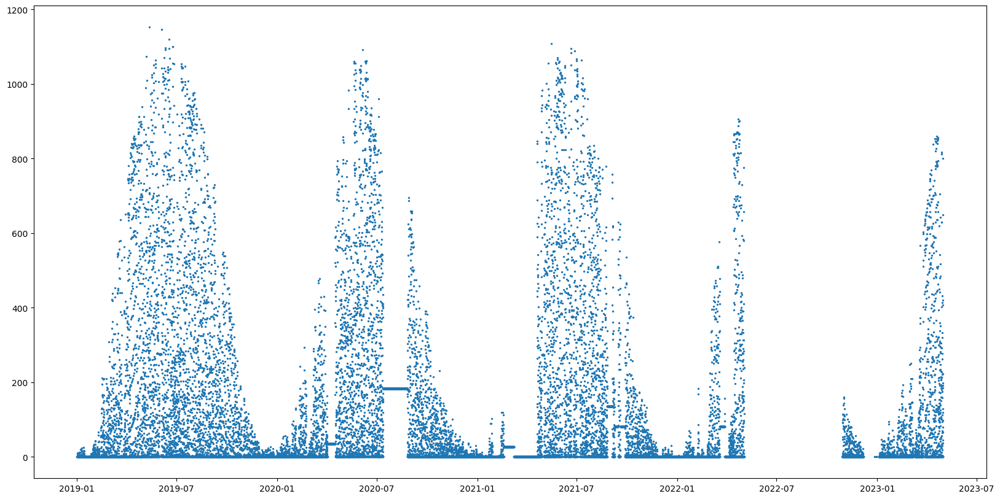

In [119]:
fig, axs = plt.subplots(1, 1, figsize=(20, 10))

plt.scatter(dm.data_B["date_forecast"], dm.data_B["pv_measurement"], s=2)


In [120]:
# dm.remove_constant_periods(24)
# dm.remove_constant_periods(3, [0])

val = None
counter = 0
consequtive_zero_threshold = 23
threshold = 0.0

def remove_const_intervals(row):
    global val
    global counter
    global consequtive_zero_threshold

    if val is None: # init val as row 
        val = row
        return False

    elif val == 0.0: ## if the current value is 0.0 

        counter += 1 ## we count this 

        if counter >= consequtive_zero_threshold: ## number of seen consequtive zeros are above threshold
            val = row
            counter += 1
            return False
        
        else: 
            val = row
            return True ## we have not yet gone past threshold

    elif abs(row-val)<= threshold: ## we see a value (not zero) if below threshold we remove, this also indicates a break in any streak of zeros, setting counter to zero
        val = row
        counter = 0
        return False
    
    counter = 0
    val = row
    return True ## if all else fails, we keep the row. 


dm.data_A = dm.data_A[dm.data_A['pv_measurement'].map(remove_const_intervals)].reset_index(drop=True)
dm.data_B = dm.data_B[dm.data_B['pv_measurement'].map(remove_const_intervals)].reset_index(drop=True)
dm.data_C = dm.data_C[dm.data_C['pv_measurement'].map(remove_const_intervals)].reset_index(drop=True)


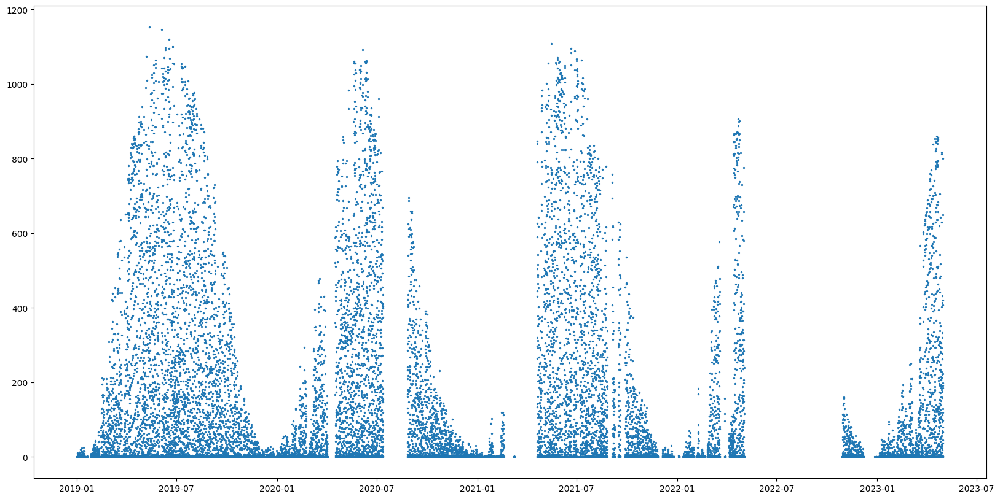

In [121]:
fig, axs = plt.subplots(1, 1, figsize=(20, 10))

plt.scatter(dm.data_B["date_forecast"], dm.data_B["pv_measurement"], s=2)


### B-C donation

In [122]:

# def donate_missing_pv(donating:pd.DataFrame, recieving:pd.DataFrame, scaling:float=1):
    
#     recieving_frame = recieving.copy()

#     recieving_dates = np.array(recieving_frame["date_forecast"])
#     beginning_date = recieving_dates[0]

#     for index, row in donating.iterrows():

#         if row["date_forecast"] not in recieving_dates and row["date_forecast"] > beginning_date: 

#             row = row
#             if row["pv_measurement"] == 0.0 or row["pv_measurement"] == -0.0: 
#                 pv = 0.0

#             else : 
#                 pv = row["pv_measurement"] * scaling


#             row["pv_measurement"] = pv

#             recieving_frame.loc[len(recieving_frame.index)] = row 

    
#     return recieving_frame.sort_values(by="date_forecast", ascending=True).reset_index(drop=True)

# data_B = donate_missing_pv(dm.data_C, dm.data_B, 1.2)
# data_C = donate_missing_pv(dm.data_B, dm.data_C, 0.8)


In [123]:
# dm.data_B = data_B
# dm.data_C = data_C

### Combining locations

In [124]:
dm.combine_all_data()

dm.sorting_columns_inMainSets()

['X_test_estimated_a', 'data_A']
['X_test_estimated_b', 'data_B']
['X_test_estimated_c', 'data_C']


### Data types

In [125]:
dm.data_A.dtypes 

dm.data_A[list(dm.data_A.select_dtypes(include='float32'))] = dm.data_A[list(dm.data_A.select_dtypes(include='float32'))].astype('float64')
dm.data_B[list(dm.data_B.select_dtypes(include='float32'))] = dm.data_B[list(dm.data_B.select_dtypes(include='float32'))].astype('float64')
dm.data_C[list(dm.data_C.select_dtypes(include='float32'))] = dm.data_C[list(dm.data_C.select_dtypes(include='float32'))].astype('float64')

dm.X_test_estimated_a[list(dm.X_test_estimated_a.select_dtypes(include='float32'))] = dm.X_test_estimated_a[list(dm.X_test_estimated_a.select_dtypes(include='float32'))].astype('float64')
dm.X_test_estimated_b[list(dm.X_test_estimated_b.select_dtypes(include='float32'))] = dm.X_test_estimated_b[list(dm.X_test_estimated_b.select_dtypes(include='float32'))].astype('float64')
dm.X_test_estimated_c[list(dm.X_test_estimated_c.select_dtypes(include='float32'))] = dm.X_test_estimated_c[list(dm.X_test_estimated_c.select_dtypes(include='float32'))].astype('float64')


# Feature engineering

## Part 1

### Pool data

In [126]:
# Set variables

data_A = dm.data_A
data_B = dm.data_B
data_C = dm.data_C

test_A = dm.X_test_estimated_a
test_B = dm.X_test_estimated_b
test_C = dm.X_test_estimated_c

In [127]:
# Mark estimated data

est_dates_A = pd.to_datetime(dm.X_train_estimated_a['date_forecast'])
est_dates_B = pd.to_datetime(dm.X_train_estimated_b['date_forecast'])
est_dates_C = pd.to_datetime(dm.X_train_estimated_c['date_forecast'])

data_A['est'] = (pd.to_datetime(data_A['date_forecast']).isin(est_dates_A)).astype(int)
data_B['est'] = (pd.to_datetime(data_B['date_forecast']).isin(est_dates_B)).astype(int)
data_C['est'] = (pd.to_datetime(data_C['date_forecast']).isin(est_dates_C)).astype(int)

test_A['est'] = 1
test_B['est'] = 1
test_C['est'] = 1

In [128]:
# Create full dataset

data_A['train'] = 1
data_B['train'] = 1
data_C['train'] = 1

test_A['train'] = 0
test_B['train'] = 0
test_C['train'] = 0

test_A['pv_measurement'] = np.nan
test_B['pv_measurement'] = np.nan
test_C['pv_measurement'] = np.nan

data_test_A = pd.concat([data_A, test_A], ignore_index=True)
data_test_B = pd.concat([data_B, test_B], ignore_index=True)
data_test_C = pd.concat([data_C, test_C], ignore_index=True)

In [129]:
# Set location as categorical

data_test_A['A'] = 1
data_test_A['B'] = 0
data_test_A['C'] = 0

data_test_B['A'] = 0
data_test_B['B'] = 1
data_test_B['C'] = 0

data_test_C['A'] = 0
data_test_C['B'] = 0
data_test_C['C'] = 1

data_test_A = data_test_A.drop('location', axis='columns')
data_test_B = data_test_B.drop('location', axis='columns')
data_test_C = data_test_C.drop('location', axis='columns')


### Precip type to category

In [130]:
# Allready removed

"""
categories = ['precip_none', 'precip_rain', 'precip_rain_Snow', 'precip_snow', 'precip_sleet', 'precip_freezing_rain', 'precip_hail']

def add_precip_category(df, categories):
    # Assuming 'precip_type_5min:idx' contains integer category indices
    # Ensure the indices are integers
    df['precip_type_5min:idx'] = df['precip_type_5min:idx'].astype(int)

    # Get dummies and concatenate with the original dataframe
    dummies = pd.get_dummies(df['precip_type_5min:idx'], prefix='precip_type').astype(int)
    df = pd.concat([df, dummies], axis=1)

    return df

# Apply the function
data_test_A = add_precip_category(data_test_A, categories)
data_test_B = add_precip_category(data_test_B, categories)
data_test_C = add_precip_category(data_test_C, categories)
# Drop precip_type
data_test_A = data_test_A.drop('precip_type_5min:idx', axis='columns')
data_test_B = data_test_B.drop('precip_type_5min:idx', axis='columns')
data_test_C = data_test_C.drop('precip_type_5min:idx', axis='columns')
"""

"\ncategories = ['precip_none', 'precip_rain', 'precip_rain_Snow', 'precip_snow', 'precip_sleet', 'precip_freezing_rain', 'precip_hail']\n\ndef add_precip_category(df, categories):\n    # Assuming 'precip_type_5min:idx' contains integer category indices\n    # Ensure the indices are integers\n    df['precip_type_5min:idx'] = df['precip_type_5min:idx'].astype(int)\n\n    # Get dummies and concatenate with the original dataframe\n    dummies = pd.get_dummies(df['precip_type_5min:idx'], prefix='precip_type').astype(int)\n    df = pd.concat([df, dummies], axis=1)\n\n    return df\n\n# Apply the function\ndata_test_A = add_precip_category(data_test_A, categories)\ndata_test_B = add_precip_category(data_test_B, categories)\ndata_test_C = add_precip_category(data_test_C, categories)\n# Drop precip_type\ndata_test_A = data_test_A.drop('precip_type_5min:idx', axis='columns')\ndata_test_B = data_test_B.drop('precip_type_5min:idx', axis='columns')\ndata_test_C = data_test_C.drop('precip_type_5min

### Temporal features

In [131]:
# Dates columns

def extract_dates(df):
    # Convert 'date_forecast' to datetime
    df['date_forecast'] = pd.to_datetime(df['date_forecast'])

    # Extract year, month, and day
    df['year'] = df['date_forecast'].dt.year
    df['month'] = df['date_forecast'].dt.month
    df['day'] = df['date_forecast'].dt.day

    return df

data_test_A = extract_dates(data_test_A)
data_test_B = extract_dates(data_test_B)
data_test_C = extract_dates(data_test_C)


In [132]:
# Add daily and annual sinus curve

def hour_func(x): 
    return np.cos(2*np.pi/24 * x)

data_test_A["daily_sinus"] = hour_func(data_test_A["date_forecast"].dt.hour)
data_test_B["daily_sinus"] = hour_func(data_test_B["date_forecast"].dt.hour)
data_test_C["daily_sinus"] = hour_func(data_test_C["date_forecast"].dt.hour)

#plot_feature(data_test_A.iloc[:40], 'daily_sinus')

def day_func(x): 
    return np.cos(2*np.pi/365 * x - 2*np.pi/365 * 173)

data_test_A["annual_sinus"] = day_func(data_test_A["date_forecast"].dt.dayofyear)
data_test_B["annual_sinus"] = day_func(data_test_B["date_forecast"].dt.dayofyear)
data_test_C["annual_sinus"] = day_func(data_test_C["date_forecast"].dt.dayofyear)

#plot_feature(data_test_A.iloc[8000:10000], 'annual_sinus')

### Mark weird cloud data as category

In [133]:
data_test_A['bad_cloud_data'] = (data_test_A['date_forecast'] < pd.to_datetime('2020-03-26 00:00:00')).astype(int)
data_test_B['bad_cloud_data'] = (data_test_B['date_forecast'] < pd.to_datetime('2020-03-26 00:00:00')).astype(int)
data_test_C['bad_cloud_data'] = (data_test_C['date_forecast'] < pd.to_datetime('2020-03-26 00:00:00')).astype(int)

### Clip sun elevation

In [134]:
# When sun elevation is below ca. -5, no pv_measurement is recorded

data_test_A['sun_elevation:d'] = data_test_A['sun_elevation:d'].clip(lower=0)
data_test_B['sun_elevation:d'] = data_test_B['sun_elevation:d'].clip(lower=0)
data_test_C['sun_elevation:d'] = data_test_C['sun_elevation:d'].clip(lower=0)

### Cloud data

In [135]:
# Create mask for open sky, clip negative values for clouds

data_test_A['open_sky'] = ( data_test_A['cloud_base_agl:m'] < 0).astype(int)
data_test_B['open_sky'] = ( data_test_B['cloud_base_agl:m'] < 0).astype(int)
data_test_C['open_sky'] = ( data_test_C['cloud_base_agl:m'] < 0).astype(int)

#data_test_A['cloud_base_agl:m'] = data_test_A['cloud_base_agl:m'].clip(lower=0)
#data_test_B['cloud_base_agl:m'] = data_test_B['cloud_base_agl:m'].clip(lower=0)
#data_test_C['cloud_base_agl:m'] = data_test_C['cloud_base_agl:m'].clip(lower=0)


### Lag and lead

In [136]:
# Create lag and lead for direct sun rad

def create_lag_average_column(df, column_name, lag_window):
    """
    Creates a new column in the DataFrame which is the average of the last 3 rows of the specified column.
    For the first two rows, it uses the available values for averaging.

    :param df: Pandas DataFrame.
    :param column_name: The name of the column for which the lagged average is calculated.
    :return: DataFrame with the new lag average column added.
    """
    # Ensure that the DataFrame has the specified column
    if column_name not in df.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")

    # Calculate the rolling average of the last 3 rows
    df[f'{column_name}_lag_avg'] = df[column_name].rolling(window=lag_window, min_periods=1).mean()

    return df

lag_window = 10

data_test_A = create_lag_average_column(data_test_A, 'direct_rad:W', lag_window)
data_test_B = create_lag_average_column(data_test_B, 'direct_rad:W', lag_window)
data_test_C = create_lag_average_column(data_test_C, 'direct_rad:W', lag_window)

#data_test_A = create_lag_average_column(data_test_A, 'diffuse_rad:W', lag_window)
#data_test_B = create_lag_average_column(data_test_B, 'diffuse_rad:W', lag_window)
#data_test_C = create_lag_average_column(data_test_C, 'diffuse_rad:W', lag_window)


In [137]:
# Continuing with lead

def create_lead_average_column(df, column_name, lead_window):
    """
    Creates a new column in the DataFrame which is the average of the next 3 rows of the specified column.
    For the last two rows, it uses the available values for averaging.

    :param df: Pandas DataFrame.
    :param column_name: The name of the column for which the lead average is calculated.
    :return: DataFrame with the new lead average column added.
    """
    # Ensure that the DataFrame has the specified column
    if column_name not in df.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")

    # Reverse the DataFrame, calculate the rolling average, and then reverse it back
    df_reversed = df.iloc[::-1].copy()
    df_reversed[f'{column_name}_lead_avg'] = df_reversed[column_name].rolling(window=lead_window, min_periods=1).mean()
    df[f'{column_name}_lead_avg'] = df_reversed[f'{column_name}_lead_avg'].iloc[::-1].values

    return df

lead_window = 1

data_test_A = create_lead_average_column(data_test_A, 'direct_rad:W', lead_window)
data_test_B = create_lead_average_column(data_test_B, 'direct_rad:W', lead_window)
data_test_C = create_lead_average_column(data_test_C, 'direct_rad:W', lead_window)

#data_test_A = create_lead_average_column(data_test_A, 'diffuse_rad:W', lead_window)
#data_test_B = create_lead_average_column(data_test_B, 'diffuse_rad:W', lead_window)
#data_test_C = create_lead_average_column(data_test_C, 'diffuse_rad:W', lead_window)

In [138]:
# Create central derivative column

def create_central_difference_column(df, column_name, new_column_name):
    """
    Creates a new column in the DataFrame which is the central difference of the specified column with respect
    to the previous and next row. For the first and last rows, forward and backward differences are used.

    :param df: Pandas DataFrame.
    :param column_name: The name of the column for which the central difference is calculated.
    :param new_column_name: The name of the new column to store the central difference.
    :return: DataFrame with the new central difference column added.
    """

    # Ensure that the DataFrame has the specified column
    if column_name not in df.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")

    # Calculate the central difference
    df[new_column_name] = (df[column_name].shift(-1) - df[column_name].shift(1)) / 2

    # Handle the first row using forward difference
    df.at[0, new_column_name] = df.at[1, column_name] - df.at[0, column_name]

    # Handle the last row using backward difference
    last_idx = df.index[-1]
    df.at[last_idx, new_column_name] = df.at[last_idx, column_name] - df.at[last_idx - 1, column_name]

    return df

data_test_A = create_central_difference_column(data_test_A, 'direct_rad:W', 'direct_rad_CD')
data_test_B = create_central_difference_column(data_test_B, 'direct_rad:W', 'direct_rad_CD')
data_test_C = create_central_difference_column(data_test_C, 'direct_rad:W', 'direct_rad_CD')

### Difference between columns

In [139]:
# Create difference between columns

def create_difference_column(df, column1, column2, new_column_name):
    """
    Creates a new column in the DataFrame which is the difference between two specified columns.

    :param df: Pandas DataFrame.
    :param column1: The name of the first column.
    :param column2: The name of the second column.
    :param new_column_name: The name of the new column to store the difference.
    :return: DataFrame with the new difference column added.
    """
    # Ensure that the DataFrame has the specified columns
    if column1 not in df.columns:
        raise ValueError(f"Column '{column1}' not found in the DataFrame.")
    if column2 not in df.columns:
        raise ValueError(f"Column '{column2}' not found in the DataFrame.")

    # Calculate the difference and store it in the new column
    df[new_column_name] = df[column1] - df[column2]

    return df


#data_test_A = create_difference_column(data_test_A, 'is_day:idx', 'is_in_shadow:idx', 'diff_day_shadow')


### Drop useless columns

In [140]:
# Drop useless columns
useless_col = [
    'fresh_snow_12h:cm',
    'fresh_snow_24h:cm',
    'pressure_50m:hPa',
    'msl_pressure:hPa',
    'sfc_pressure:hPa',
]

data_test_A = data_test_A.drop(useless_col, axis='columns')
data_test_B = data_test_B.drop(useless_col, axis='columns')
data_test_C = data_test_C.drop(useless_col, axis='columns')


### Split by train/test

In [141]:
# Split by train / test

data_A = data_test_A[ data_test_A['train'] == 1 ]
data_B = data_test_B[ data_test_B['train'] == 1 ]
data_C = data_test_C[ data_test_C['train'] == 1 ]

test_A = data_test_A[ data_test_A['train'] == 0 ]
test_B = data_test_B[ data_test_B['train'] == 0 ]
test_C = data_test_C[ data_test_C['train'] == 0 ]


In [142]:
# Drop NaN pv_measurement
test_A = test_A.drop('pv_measurement', axis='columns')
test_B = test_B.drop('pv_measurement', axis='columns')
test_C = test_C.drop('pv_measurement', axis='columns')

In [143]:
data_A.to_csv("current_csv_files/data_A_check.csv", index=False)

## Part 2 - Prophet

### Interpolate to fit Prophet

In [144]:
# Impute missing rows in A
# Load the dataset again for imputation
data_A_impute = data_A.copy()

# Convert 'date_forecast' to datetime
data_A_impute['date_forecast'] = pd.to_datetime(data_A_impute['date_forecast'])

# Create a complete time series from start to end
full_time_series_A = pd.date_range(start=data_A_impute['date_forecast'].min(), 
                                 end=data_A_impute['date_forecast'].max(), 
                                 freq='H')
full_df_A = pd.DataFrame(full_time_series_A, columns=['date_forecast'])

# Merge the full time series with the existing data (this will introduce NaNs where data is missing)
full_df_A = full_df_A.merge(data_A_impute, on='date_forecast', how='left')

# Function to apply makima (monotone cubic) interpolation for a given column
def makima_interpolation(df, column):
    # Extract the index and values where the column is not NaN
    valid_idx = np.where(~df[column].isna())[0]
    valid_values = df.loc[valid_idx, column]

    # Create the interpolating function
    interpolator = PchipInterpolator(valid_idx, valid_values)

    # Apply the interpolator to the entire column
    all_idx = np.arange(len(df))
    interpolated_values = interpolator(all_idx)

    # Replace the column with interpolated values
    df[column] = interpolated_values
    return df

# Apply makima interpolation to the specified columns
columns_to_interpolate = ['pv_measurement', 'direct_rad:W', 'clear_sky_rad:W', 'diffuse_rad:W']
for col in columns_to_interpolate:
    full_df_A = makima_interpolation(full_df_A, col)

# Check if any NaNs remain in the interpolated columns
#nan_check_after_interpolation = full_df[columns_to_interpolate].isnull().sum()
#nan_check_after_interpolation, full_df.head()




In [145]:
# Preparing full_df_A
full_df_A_prophet = full_df_A[['date_forecast', 'pv_measurement']].copy()
full_df_A_prophet.rename(columns={'date_forecast': 'ds', 'pv_measurement': 'y'}, inplace=True)

# Convert 'ds' columns to datetime
full_df_A_prophet['ds'] = pd.to_datetime(full_df_A_prophet['ds'])

### Fit and predict

In [164]:
# Initialize the Prophet model
p_model = Prophet()

# Fit the model on the full dataset
p_model.fit(full_df_A_prophet)

19:28:49 - cmdstanpy - INFO - Chain [1] start processing
19:28:52 - cmdstanpy - INFO - Chain [1] done processing


In [165]:
# Create future dataframe for predictions on full_df_A
dates = p_model.make_future_dataframe(periods=1536, freq='H', include_history=True)
prophet_prediction = p_model.predict(dates)

In [167]:
fig = plot_plotly(p_model, prophet_prediction)  # model is your Prophet model
fig.show()

In [161]:
testerino = model.make_future_dataframe(periods=1536, freq='H')
testerino

,ds
0,2019-06-02 23:00:00
1,2019-06-03 00:00:00
2,2019-06-03 01:00:00
3,2019-06-03 02:00:00
4,2019-06-03 03:00:00
...,...
35804,2023-07-03 19:00:00
35805,2023-07-03 20:00:00
35806,2023-07-03 21:00:00
35807,2023-07-03 22:00:00


In [86]:
forecast_full = forecast_full.rename({'ds': 'date_forecast'})

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,clear_sky_rad:W,clear_sky_rad:W_lower,clear_sky_rad:W_upper,daily,daily_lower,daily_upper,diffuse_rad:W,diffuse_rad:W_lower,diffuse_rad:W_upper,direct_rad:W,direct_rad:W_lower,direct_rad:W_upper,extra_regressors_additive,extra_regressors_additive_lower,extra_regressors_additive_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-06-02 23:00:00,458.695387,-851.391013,300.325950,458.695387,458.695387,-704.660238,-704.660238,-704.660238,-116.249667,-116.249667,-116.249667,-38.185172,-38.185172,-38.185172,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,18.242199,18.242199,18.242199,-90.629440,-90.629440,-90.629440,0.0,0.0,0.0,-245.964851
1,2019-06-03 00:00:00,458.763031,-825.437168,384.104788,458.763031,458.763031,-693.323949,-693.323949,-693.323949,-116.249667,-116.249667,-116.249667,-28.017825,-28.017825,-28.017825,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,19.355407,19.355407,19.355407,-90.573707,-90.573707,-90.573707,0.0,0.0,0.0,-234.560918
2,2019-06-03 01:00:00,458.830675,-816.292986,415.321377,458.830675,458.830675,-686.520355,-686.520355,-686.520355,-115.678261,-115.678261,-115.678261,-23.933486,-23.933486,-23.933486,-144.006945,-144.006945,-144.006945,-332.790497,-332.790497,-332.790497,-592.475703,-592.475703,-592.475703,20.406523,20.406523,20.406523,-90.517689,-90.517689,-90.517689,0.0,0.0,0.0,-227.689680
3,2019-06-03 02:00:00,458.898319,-780.483325,425.078527,458.898319,458.898319,-642.009989,-642.009989,-642.009989,-98.650382,-98.650382,-98.650382,-38.946602,-38.946602,-38.946602,-103.505732,-103.505732,-103.505732,-331.836070,-331.836070,-331.836070,-533.992184,-533.992184,-533.992184,21.390188,21.390188,21.390188,-90.461392,-90.461392,-90.461392,0.0,0.0,0.0,-183.111671
4,2019-06-03 03:00:00,458.965963,-568.848159,591.917340,458.965963,458.965963,-467.076184,-467.076184,-467.076184,-51.966567,-51.966567,-51.966567,-65.795071,-65.795071,-65.795071,11.493424,11.493424,11.493424,-292.704562,-292.704562,-292.704562,-333.177705,-333.177705,-333.177705,22.301413,22.301413,22.301413,-90.404821,-90.404821,-90.404821,0.0,0.0,0.0,-8.110221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34268,2023-04-30 19:00:00,624.506975,-538.183917,666.903241,624.506975,624.506975,-572.873591,-572.873591,-572.873591,-113.030750,-113.030750,-113.030750,-53.554374,-53.554374,-53.554374,-135.247583,-135.247583,-135.247583,-332.154212,-332.154212,-332.154212,-580.432545,-580.432545,-580.432545,13.286036,13.286036,13.286036,47.827292,47.827292,47.827292,0.0,0.0,0.0,51.633384
34269,2023-04-30 20:00:00,624.504593,-557.475012,660.496180,624.504593,624.504593,-563.146560,-563.146560,-563.146560,-116.249667,-116.249667,-116.249667,-31.276658,-31.276658,-31.276658,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,14.588212,14.588212,14.588212,47.629710,47.629710,47.629710,0.0,0.0,0.0,61.358033
34270,2023-04-30 21:00:00,624.502211,-509.399129,698.298667,624.502211,624.502211,-562.106822,-562.106822,-562.106822,-116.249667,-116.249667,-116.249667,-31.303223,-31.303223,-31.303223,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,15.852522,15.852522,15.852522,47.431704,47.431704,47.431704,0.0,0.0,0.0,62.395389
34271,2023-04-30 22:00:00,624.499829,-498.183250,702.500274,624.499829,624.499829,-568.884388,-568.884388,-568.884388,-116.249667,-116.249667,-116.249667,-39.102421,-39.102421,-39.102421,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,17.072583,17.0

In [87]:
forecast_test

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,clear_sky_rad:W,clear_sky_rad:W_lower,clear_sky_rad:W_upper,daily,daily_lower,daily_upper,diffuse_rad:W,diffuse_rad:W_lower,diffuse_rad:W_upper,direct_rad:W,direct_rad:W_lower,direct_rad:W_upper,extra_regressors_additive,extra_regressors_additive_lower,extra_regressors_additive_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-05-01 00:00:00,624.495065,-537.166686,725.994498,624.495065,624.495065,-481.804235,-481.804235,-481.804235,-116.249667,-116.249667,-116.249667,123.798654,123.798654,123.798654,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,9.232365,9.232365,9.232365,-20.747429,-20.747429,-20.747429,0.0,0.0,0.0,142.690830
1,2023-05-01 01:00:00,624.492683,-446.291489,757.395077,624.492683,624.492683,-481.839712,-481.839712,-481.839712,-116.249667,-116.249667,-116.249667,123.764004,123.764004,123.764004,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,9.231472,9.231472,9.231472,-20.747363,-20.747363,-20.747363,0.0,0.0,0.0,142.652971
2,2023-05-01 02:00:00,624.490301,-485.836294,727.052720,624.490301,624.490301,-481.887025,-481.887025,-481.887025,-116.249667,-116.249667,-116.249667,123.717793,123.717793,123.717793,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,9.230281,9.230281,9.230281,-20.747274,-20.747274,-20.747274,0.0,0.0,0.0,142.603276
3,2023-05-01 03:00:00,624.487919,-386.561851,796.027124,624.487919,624.487919,-427.155111,-427.155111,-427.155111,-107.354790,-107.354790,-107.354790,123.671569,123.671569,123.671569,-112.525275,-112.525275,-112.525275,-319.428520,-319.428520,-319.428520,-539.308585,-539.308585,-539.308585,9.229091,9.229091,9.229091,-20.747186,-20.747186,-20.747186,0.0,0.0,0.0,197.332808
4,2023-05-01 04:00:00,624.485537,-66.448340,1090.716589,624.485537,624.485537,-97.033166,-97.033166,-97.033166,-57.680620,-57.680620,-57.680620,123.636894,123.636894,123.636894,19.385529,19.385529,19.385529,-170.856047,-170.856047,-170.856047,-209.151138,-209.151138,-209.151138,9.228198,9.228198,9.228198,-20.747120,-20.747120,-20.747120,0.0,0.0,0.0,527.452371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,2023-07-03 19:00:00,620.848198,-239.133377,945.960213,611.352144,630.288081,-293.668469,-293.668469,-293.668469,-51.414210,-51.414210,-51.414210,46.526653,46.526653,46.526653,-28.400703,-28.400703,-28.400703,-247.369280,-247.369280,-247.369280,-327.184193,-327.184193,-327.184193,7.614973,7.614973,7.614973,-20.625903,-20.625903,-20.625903,0.0,0.0,0.0,327.179729
716,2023-07-03 20:00:00,620.845816,-410.608872,819.867679,611.329010,630.300360,-469.463489,-469.463489,-469.463489,-97.355198,-97.355198,-97.355198,46.459553,46.459553,46.459553,-95.353456,-95.353456,-95.353456,-310.202392,-310.202392,-310.202392,-502.911045,-502.911045,-502.911045,7.613818,7.613818,7.613818,-20.625815,-20.625815,-20.625815,0.0,0.0,0.0,151.382327
717,2023-07-03 21:00:00,620.843434,-493.844522,661.209670,611.305875,630.312640,-555.227293,-555.227293,-555.227293,-115.278278,-115.278278,-115.278278,46.392437,46.392437,46.392437,-140.537891,-140.537891,-140.537891,-332.790497,-332.790497,-332.790497,-588.606665,-588.606665,-588.606665,7.612663,7.612663,7.612663,-20.625727,-20.625727,-20.625727,0.0,0.0,0.0,65.616141
718,2023-07-03 22:00:00,620.841052,-581.396718,647.335604,611.282740,630.324920,-560.759600,-560.759600,-560.759600,-116.249667,-116.249667,-116.249667,46.342089,46.342089,46.342089,-145.047662,-145.047662,-145.047662,-332.790497,-332.790497,-332.790497,-594.087825,-594.087825,-594.087825,7.611797,7.611797,7.611797,-20.625661,-20.625661,-20.625661,0.

In [88]:
# Plot the forecast
fig = plot_plotly(model, forecast_test)  # model is your Prophet model
fig.show()

In [ ]:
data_A

In [148]:
def prophet_prediction(data_loc, test_loc):
    # Define features
    feature1 = 'direct_rad:W'
    feature2 = 'clear_sky_rad:W'
    feature3 = 'diffuse_rad:W'

    start_date = data_loc['date_forecast'].iloc[0]
    p = len(data_loc)

    # Create DataFrame for Prophet
    dates = pd.date_range(start=start_date, periods=p, freq='H')
    df = pd.DataFrame({
        'ds': dates,
        'y': data_loc['pv_measurement'],
        'feature1': data_loc[feature1],
        'feature2': data_loc[feature2],
        'feature3': data_loc[feature3]
    })

    # Fill missing values
    df.fillna(method='ffill', inplace=True)

    # Initialize and configure Prophet model
    model = Prophet()
    model.add_regressor('feature1')
    model.add_regressor('feature2')
    model.add_regressor('feature3')

    # Fit the model
    model.fit(df)

    # Prepare future dataframe
    test_length = len(test_loc)  # Length of the test data
    future_dates = model.make_future_dataframe(periods=test_length, include_history=True, freq='H')

    # Concatenate features for gap and test periods
    future_dates['feature1'] = pd.concat([df['feature1'], test_loc[feature1]], ignore_index=True)
    future_dates['feature2'] = pd.concat([df['feature2'], test_loc[feature2]], ignore_index=True)
    future_dates['feature3'] = pd.concat([df['feature3'], test_loc[feature3]], ignore_index=True)

    # Make predictions
    forecast = model.predict(future_dates)

    return model, forecast



In [ ]:
from fbprophet import Prophet

# Assuming full_df_A_prophet and test_A_prophet are already prepared as shown previously

# Initialize the Prophet model
model = Prophet()

# Add the additional regressors
model.add_regressor('direct_rad:W')
model.add_regressor('clear_sky_rad:W')
model.add_regressor('diffuse_rad:W')

# Fit the model on the full dataset
model.fit(full_df_A_prophet)

# Create future dataframe for predictions on full_df_A
future_full = model.make_future_dataframe(periods=0, freq='H')
future_full = future_full.merge(full_df_A_prophet[['ds', 'direct_rad:W', 'clear_sky_rad:W', 'diffuse_rad:W']], on='ds', how='left')

# Predict on the full dataset
forecast_full = model.predict(future_full)

# Create future dataframe for predictions on test_A
future_test = test_A_prophet.copy()

# Predict on the test dataset
forecast_test = model.predict(future_test)

# The forecast_full and forecast_test DataFrames now contain the predictions


### Dataset A

In [149]:
(model_A, forecast_A) = prophet_prediction(full_df_A, test_A)

18:40:55 - cmdstanpy - INFO - Chain [1] start processing
18:41:01 - cmdstanpy - INFO - Chain [1] done processing


In [86]:
# Plot the forecast
#fig = plot_plotly(model_A, forecast_A)  # model is your Prophet model
#fig.show()

In [87]:
#fig = plot_components_plotly(model_A, forecast_A)
#fig.show()

In [150]:
components_A = forecast_A[['ds', 'yhat', 'trend', 'yearly', 'weekly', 'daily']]
components_A = components_A.rename({
    'ds': 'date_forecast',
    'yhat': 'prophet_pred',
    'yearly': 'yearly_trend',
    'weekly': 'weekly_trend',
    'daily': 'daily_trend'
    }, axis='columns')



"""
N = 32000
start = 0 +N
stop = 10000 +N

plt.figure(figsize=(20, 7))
plt.plot(data_test_A['date_forecast'].iloc[start:stop], data_test_A['pv_measurement'].iloc[start:stop])
plt.plot(components_df['date_forecast'].iloc[start:stop], components_df['yhat'].clip(lower=0).iloc[start:stop])
"""

"\nN = 32000\nstart = 0 +N\nstop = 10000 +N\n\nplt.figure(figsize=(20, 7))\nplt.plot(data_test_A['date_forecast'].iloc[start:stop], data_test_A['pv_measurement'].iloc[start:stop])\nplt.plot(components_df['date_forecast'].iloc[start:stop], components_df['yhat'].clip(lower=0).iloc[start:stop])\n"

In [102]:
components_A

,date_forecast,prophet_pred,trend,yearly_trend,weekly_trend,daily_trend
0,2019-06-02 23:00:00,-245.964851,458.695387,-90.629440,18.242199,-38.185172
1,2019-06-03 00:00:00,-234.560918,458.763031,-90.573707,19.355407,-28.017825
2,2019-06-03 01:00:00,-227.689680,458.830675,-90.517689,20.406523,-23.933486
3,2019-06-03 02:00:00,-183.111671,458.898319,-90.461392,21.390188,-38.946602
4,2019-06-03 03:00:00,-8.110221,458.965963,-90.404821,22.301413,-65.795071
...,...,...,...,...,...,...
34988,2023-05-30 19:00:00,150.418158,622.791923,-93.605724,1.970526,-53.554374
34989,2023-05-30 20:00:00,-3.814832,622.789541,-93.587657,1.170987,-31.276658
34990,2023-05-30 21:00:00,-90.273218,622.787159,-93.568910,0.418420,-31.303223
34991,2023-05-30 22:00:00,-104.240699,622.784777,-93.549486,-0.285745,-39.102421


In [90]:
data_A

,date_forecast,pv_measurement,is_day:idx,is_in_shadow:idx,clear_sky_energy_1h:J,diffuse_rad_1h:J,direct_rad_1h:J,precip_5min:mm,rain_water:kgm2,snow_water:kgm2,super_cooled_liquid_water:kgm2,absolute_humidity_2m:gm3,air_density_2m:kgm3,clear_sky_rad:W,dew_point_2m:K,diffuse_rad:W,direct_rad:W,effective_cloud_cover:p,pressure_100m:hPa,relative_humidity_1000hPa:p,sun_azimuth:d,sun_elevation:d,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,cloud_base_agl:m,est,train,A,B,C,year,month,day,daily_sinus,annual_sinus,bad_cloud_data,open_sky,direct_rad:W_lag_avg,direct_rad:W_lead_avg,direct_rad_CD
0,2019-06-02 23:00:00,0.00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.1,0.8,0.000,7.700,1.22350,0.000,280.299988,0.000,0.00,99.750000,992.674988,68.000000,91.980751,0.00000,286.899994,100.000000,33770.648438,3.350,-3.350,0.275,1689.824951,0,1,1,0,0,2019,6,2,0.965926,0.941317,1,0,0.000000,0.00,0.000000
1,2019-06-03 00:00:00,0.00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.4,1.6,0.000,7.875,1.21975,0.000,280.649994,0.000,0.00,100.000000,992.000000,67.949997,14.934750,0.00000,286.950012,100.000000,13595.500000,3.050,-2.950,0.750,1563.224976,0,1,1,0,0,2019,6,3,1.000000,0.946988,1,0,0.000000,0.00,0.000000
2,2019-06-03 01:00:00,0.00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.5,2.2,0.000,8.425,1.21800,0.750,281.674988,0.300,0.00,100.000000,991.500000,73.875000,28.630251,0.00000,286.750000,100.000000,2321.850098,2.725,-2.600,0.875,1283.425049,0,1,1,0,0,2019,6,3,0.965926,0.946988,1,0,0.000000,0.00,0.075000
3,2019-06-03 02:00:00,19.36,1.0,0.0,6546.899902,7743.299805,0.000000,0.0,0.4,1.0,0.000,8.950,1.21800,23.100,282.500000,11.975,0.15,84.875000,990.550049,79.925003,41.997501,3.05125,286.450012,99.224998,11634.799805,2.550,-2.350,0.925,1003.500000,0,1,1,0,0,2019,6,3,0.866025,0.946988,1,0,0.037500,0.15,3.150000
4,2019-06-03 03:00:00,251.02,1.0,0.0,102225.898438,60137.601562,3158.300049,0.0,0.0,0.4,0.000,9.250,1.21650,84.375,283.049988,45.125,6.30,65.025002,989.750000,82.849998,55.041748,8.07100,286.475006,94.800003,29848.199219,2.300,-2.200,0.800,809.375000,0,1,1,0,0,2019,6,3,0.707107,0.946988,1,0,1.290000,6.30,21.787499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34032,2023-04-30 19:00:00,9.02,1.0,0.0,157319.796875,94492.000000,32192.599609,0.0,0.0,0.0,0.000,4.550,1.27650,4.225,272.424988,2.825,0.10,96.699997,1001.574951,74.625000,304.939240,0.00000,275.024994,96.699997,23417.074219,5.175,4.800,1.925,542.700012,1,1,1,0,0,2023,4,30,0.258819,0.611886,0,0,86.967499,0.10,-3.637500
34033,2023-04-30 20:00:00,0.00,0.0,1.0,8133.899902,15967.400391,705.400024,0.0,0.0,0.0,0.000,4.500,1.27975,0.000,272.299988,0.000,0.00,94.224998,1001.549988,76.875000,318.625763,0.00000,274.650024,94.525002,21084.050781,4.650,4.025,2.300,546.400024,1,1,1,0,0,2023,4,30,0.500000,0.611886,0,0,74.289999,0.00,-0.050000
34034,2023-04-30 21:00:00,0.00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000,4.500,1.28100,0.000,272.299988,0.000,0.00,94.324997,1001.400024,77.775002,332.785736,0.00000,274.524994,95.675003,20792.500000,4.450,3.575,2.600,548.349976,1,1,1,0,0,2023,4,30,0.707107,0.611886,0,0,67.872498,0.00,0.000000
34035,2023-04-30 22:00:00,0.00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.1,0.100,4.500,1.28100,0.000,272.299988,0.000,0.00,97.775002,1001.250000,79.000000,347.377991,0.00000,274.325012,98.875000,14158.099609,4.100,3.175,2.550,527.775024,1,1,1,0,0,2023,4,30,0.866025,0.611886,0,0,61.082499,0.00,0.000000


In [91]:
components_A

,date_forecast,prophet_pred,trend,yearly_trend,weekly_trend,daily_trend
0,2019-06-02 23:00:00,-255.427798,461.886609,-96.854468,18.917513,-33.272195
1,2019-06-03 00:00:00,-251.172801,461.954365,-96.762001,18.972065,-29.231974
2,2019-06-03 01:00:00,-237.909656,462.022122,-96.669607,18.946590,-17.763173
3,2019-06-03 02:00:00,-176.725410,462.089878,-96.577292,18.841693,-17.036887
4,2019-06-03 03:00:00,9.132612,462.157635,-96.485064,18.658725,-37.626609
...,...,...,...,...,...,...
34752,2023-05-20 23:00:00,171.835819,630.592230,-94.547393,2.508625,-33.272195
34753,2023-05-21 00:00:00,-2.543097,630.589958,-94.733437,3.271864,-29.231974
34754,2023-05-21 01:00:00,-78.425190,630.587686,-94.918116,4.067977,-17.763173
34755,2023-05-21 02:00:00,-82.765052,630.585414,-95.101430,4.893107,-17.036887


In [151]:
data_A['date_forecast'] = pd.to_datetime(data_A['date_forecast']).astype('datetime64[ns]')
test_A['date_forecast'] = pd.to_datetime(test_A['date_forecast']).astype('datetime64[ns]')
components_A['date_forecast'] = pd.to_datetime(components_A['date_forecast']).astype('datetime64[ns]')

data_A_m = data_A.merge(components_A, on='date_forecast', how='left')
test_A_m = test_A.merge(components_A, on='date_forecast', how='left')

/var/folders/kq/hk1l39ys077bc7f9741ypg800000gn/T/ipykernel_33749/1105148391.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_A['date_forecast'] = pd.to_datetime(data_A['date_forecast']).astype('datetime64[ns]')


In [152]:
test_A_m.isna().any()

date_forecast                     False
is_day:idx                        False
is_in_shadow:idx                  False
clear_sky_energy_1h:J             False
diffuse_rad_1h:J                  False
direct_rad_1h:J                   False
precip_5min:mm                    False
rain_water:kgm2                   False
snow_water:kgm2                   False
super_cooled_liquid_water:kgm2    False
absolute_humidity_2m:gm3          False
air_density_2m:kgm3               False
clear_sky_rad:W                   False
dew_point_2m:K                    False
diffuse_rad:W                     False
direct_rad:W                      False
effective_cloud_cover:p           False
pressure_100m:hPa                 False
relative_humidity_1000hPa:p       False
sun_azimuth:d                     False
sun_elevation:d                   False
t_1000hPa:K                       False
total_cloud_cover:p               False
visibility:m                      False
wind_speed_10m:ms                 False


In [41]:
test_A_m.tail(240)

NameError: name 'test_A_m' is not defined

In [475]:
components_A[ components_A['date_forecast']=='2023-07-03 19:00:00' ]

,date_forecast,prophet_pred,trend,yearly_trend,weekly_trend,daily_trend


In [481]:
test_A_m[ test_A_m['date_forecast'].isin(test_A['date_forecast']) ]

,date_forecast,is_day:idx,is_in_shadow:idx,clear_sky_energy_1h:J,diffuse_rad_1h:J,direct_rad_1h:J,precip_5min:mm,rain_water:kgm2,snow_water:kgm2,super_cooled_liquid_water:kgm2,absolute_humidity_2m:gm3,air_density_2m:kgm3,clear_sky_rad:W,dew_point_2m:K,diffuse_rad:W,direct_rad:W,effective_cloud_cover:p,pressure_100m:hPa,relative_humidity_1000hPa:p,sun_azimuth:d,sun_elevation:d,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,cloud_base_agl:m,est,train,A,B,C,year,month,day,daily_sinus,annual_sinus,bad_cloud_data,open_sky,direct_rad:W_lag_avg,direct_rad:W_lead_avg,direct_rad_CD,prophet_pred,trend,yearly_trend,weekly_trend,daily_trend
0,2023-05-01 00:00:00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000,4.325,1.28675,0.000000,271.650024,0.000000,0.000000,74.949997,1000.549988,80.275002,16.026501,0.0000,273.799988,74.949997,29907.500000,3.950,2.100,3.350,1061.550049,1,0,1,0,0,2023,5,1,1.000000,0.625411,0,0,31.667500,0.000000,0.000000,89.651616,631.680435,54.609563,18.972065,-29.231974
1,2023-05-01 01:00:00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000,4.275,1.28600,0.000000,271.450012,0.000000,0.000000,77.474998,1000.049988,79.824997,30.497250,0.0000,273.799988,77.474998,29519.074219,3.825,1.925,3.300,1075.100098,1,0,1,0,0,2023,5,1,0.965926,0.625411,0,0,15.852500,0.000000,0.000000,81.180094,631.678163,54.423770,18.946590,-17.763173
2,2023-05-01 02:00:00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000,4.150,1.28375,0.000000,271.049988,0.000000,0.000000,88.099998,999.500000,78.000000,44.517250,0.0000,273.849976,88.099998,31009.125000,3.650,1.750,3.200,1200.400024,1,0,1,0,0,2023,5,1,0.866025,0.625411,0,0,6.012500,0.000000,1.050000,81.612080,631.675891,54.236639,18.841693,-17.036887
3,2023-05-01 03:00:00,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000,4.025,1.28200,11.675000,270.649994,9.375000,2.100000,68.599998,998.974976,75.625000,58.083000,1.4125,273.899994,68.599998,34552.500000,3.500,1.450,3.150,1179.849976,1,0,1,0,0,2023,5,1,0.707107,0.625411,0,0,0.947500,2.100000,12.725000,60.648653,631.673620,54.048173,18.658725,-37.626609
4,2023-05-01 04:00:00,1.0,0.0,59774.500000,56574.300781,19781.400391,0.0,0.0,0.0,0.000,3.900,1.28100,76.875000,270.375000,47.400002,25.450001,66.300003,998.549988,74.224998,71.341003,7.4685,273.924988,66.300003,35483.875000,3.325,1.300,3.050,920.049988,1,0,1,0,0,2023,5,1,0.500000,0.625411,0,0,2.765000,25.450001,43.062503,31.126221,631.671348,53.858373,18.399771,-66.698014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,2023-07-03 19:00:00,1.0,0.0,616345.375000,206803.796875,55728.199219,0.0,0.0,0.0,0.100,8.350,1.19725,85.099998,281.575012,33.625000,13.425000,85.574997,979.599976,69.324997,306.687012,8.1530,287.024994,86.150002,44056.375000,2.450,2.075,-1.350,2013.750000,1,0,1,0,0,2023,7,3,0.258819,0.982126,0,0,147.795000,13.425000,-5.662500,NaN,NaN,NaN,NaN,NaN
716,2023-07-03 20:00:00,1.0,0.0,270762.812500,114295.398438,39743.699219,0.0,0.0,0.0,0.000,8.525,1.20050,24.799999,281.850006,14.325000,3.550000,74.599998,980.025024,72.900002,319.704010,3.2680,286.600006,75.324997,44017.175781,2.450,2.100,-1.250,1610.900024,1,0,1,0,0,2023,7,3,0.500000,0.982126,0,0,116.792499,3.550000,-6.712500,NaN,NaN,NaN,NaN,NaN
717,2023-07-03 21:00:00,1.0,1.0,72858.703125,46269.800781,11527.099609,0.0,0.0,0.0,0.000,8.825,1.20450,1.275000,282.325012,1.300000,0.000000,76.125000,980.349976,78.050003,333.040009,0.0000,286.100006,76.849998,43302.050781,2.575,2.150,-1.400,1622.800049,1,0,1,0,0,2023,7,3,0.707107,0.982126,0,0,83.642499,0.000000,-1.775000,NaN,NaN,NaN,NaN,NaN
718,2023-07-03 22:00:00,0.0,1.0,1440.199951,9402.900391,0.000000,0.0,0.0,0.0,0.075,9.025,1.20700,0.000000,282.675018,0.000000,0.000000,98.224998,980.700012,81.750000,346.686005,0.0000,285.549988,98.324997,40505.851562,2.250,1.800,-1.350,1767.55004

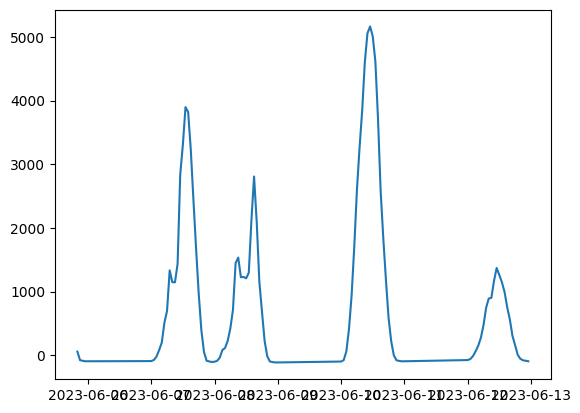

In [474]:
plt.plot(test_A_m['date_forecast'].iloc[-100:], test_A_m['prophet_pred'].iloc[-100:])

## Part 3

### Combine and sort

In [258]:
# Combine
data_ALL = pd.concat([data_A, data_B, data_C], ignore_index=True)
test_ALL = pd.concat([test_A, test_B, test_C], ignore_index=True)

In [259]:
# Sort by date forecast
data_ALL = data_ALL.sort_values(['date_forecast', 'A', 'B', 'C'], ascending=[True, False, False, False])
test_ALL = test_ALL.sort_values(['date_forecast', 'A', 'B', 'C'], ascending=[True, False, False, False])

In [260]:
# Rename
data_ALL.rename(columns={'pv_measurement': 'target'}, inplace=True)

### Set X and y

In [261]:
# Separate features and target variable
X = data_ALL.drop('target', axis='columns')
y = data_ALL[['date_forecast', 'target']]
X_kaggle = test_ALL

In [262]:
# Split data
def split_data(df, percent):
    split_index = int( np.floor( len(df)*percent ) )
    df_first = df[:split_index]
    df_last = df[split_index:]
    return df_first, df_last

train_percent = 0.94 # Of all
val_percent = 0.5 # Of non-train

X_train, X_non_train = split_data(X, train_percent)
X_val, X_test = split_data(X_non_train, val_percent)

y_train, y_non_train = split_data(y, train_percent)
y_val, y_test = split_data(y_non_train, val_percent)

### Set val data to summer last year (optional)

In [263]:
"""
X['date_forecast'] = pd.to_datetime(X['date_forecast'])
y['date_forecast'] = pd.to_datetime(y['date_forecast'])

# Define your date range
start_date = "2022-04-01 00:00:00"
end_date = "2022-08-03 23:00:00"

# Convert strings to datetime
start_date = pd.to_datetime(start_date)
end_date = pd.to_datetime(end_date)

# Filter rows within the date range
mask_X = (X['date_forecast'] >= start_date) & (X['date_forecast'] <= end_date)
mask_y = (y['date_forecast'] >= start_date) & (y['date_forecast'] <= end_date)
X_val = X.loc[mask_X]
y_val = y.loc[mask_y]

# Pop out rows within the date range to remove them from the original df
X_train = X.loc[~mask_X]
y_train = y.loc[~mask_y]
"""

'\nX[\'date_forecast\'] = pd.to_datetime(X[\'date_forecast\'])\ny[\'date_forecast\'] = pd.to_datetime(y[\'date_forecast\'])\n\n# Define your date range\nstart_date = "2022-04-01 00:00:00"\nend_date = "2022-08-03 23:00:00"\n\n# Convert strings to datetime\nstart_date = pd.to_datetime(start_date)\nend_date = pd.to_datetime(end_date)\n\n# Filter rows within the date range\nmask_X = (X[\'date_forecast\'] >= start_date) & (X[\'date_forecast\'] <= end_date)\nmask_y = (y[\'date_forecast\'] >= start_date) & (y[\'date_forecast\'] <= end_date)\nX_val = X.loc[mask_X]\ny_val = y.loc[mask_y]\n\n# Pop out rows within the date range to remove them from the original df\nX_train = X.loc[~mask_X]\ny_train = y.loc[~mask_y]\n'

### Filter X and y by summer months

In [264]:
#y = y[ X['date_forecast'].dt.month.between(4, 8) ]
#X = X[ X['date_forecast'].dt.month.between(4, 8) ]

### Load external data (optional)

In [265]:
"""
"""
test_ALL_to_sub = pd.read_csv("current_csv_files/test_ALL.csv")
test_ALL_to_sub_ABC = test_ALL_to_sub.sort_values(['A', 'B', 'C', 'date_forecast'], ascending=[False, False, False, True])
y_hat_kaggle = pd.read_csv("teo_subs/kaggle_149.csv", index_col='id')
test_ALL_to_sub_ABC['new_index'] = range(2160)
test_ALL_to_sub_ABC = test_ALL_to_sub_ABC.set_index('new_index')
test_ALL_to_sub_ABC['y_hat_kaggle'] = y_hat_kaggle
test_ALL_to_sub_sorted = test_ALL_to_sub_ABC.sort_values(['date_forecast', 'A', 'B', 'C'], ascending=[True, False, False, False])
test_ALL_to_sub_sorted = test_ALL_to_sub_sorted.set_index('date_forecast')
y_hat = test_ALL_to_sub_sorted['y_hat_kaggle']

### Set date as index

In [266]:
X = X.set_index('date_forecast')
y = y.set_index('date_forecast')

X_train = X_train.set_index('date_forecast')
y_train = y_train.set_index('date_forecast')

X_non_train = X_non_train.set_index('date_forecast')
y_non_train = y_non_train.set_index('date_forecast')

X_val = X_val.set_index('date_forecast')
y_val = y_val.set_index('date_forecast')

X_test = X_test.set_index('date_forecast')
y_test = y_test.set_index('date_forecast')

X_kaggle = X_kaggle.set_index('date_forecast')

### Feature scaling

In [267]:
# Prepare features for scaling

feature_dont_touch = [
    'date_forecast',
    'is_day:idx',
    'is_in_shadow:idx',
    'pv_measurement',
    'est',
    'train',
    'A',
    'B',
    'C',
    'daily_sinus',
    'annual_sinus',
    'bad_cloud_data',
    'open_sky'
]

feature_to_standardize = [
    'absolute_humidity_2m:gm3',
    'air_density_2m:kgm3',
    'dew_point_2m:K',
    'pressure_100m:hPa',
    'relative_humidity_1000hPa:p',
    't_1000hPa:K',
    'wind_speed_u_10m:ms',
    'wind_speed_v_10m:ms',
    'direct_rad_CD', # Central difference

    'prophet_pred',
    'yearly_trend',
    'weekly_trend',
    'daily_trend'

    # Kinda useless
    #'pressure_50m:hPa',
    #'msl_pressure:hPa',
    #'sfc_pressure:hPa',
]

feature_to_normalize = [
    'cloud_base_agl:m',
    'clear_sky_energy_1h:J',
    'diffuse_rad_1h:J',
    'direct_rad_1h:J',
    'precip_5min:mm',
    'rain_water:kgm2',
    'snow_water:kgm2',
    'super_cooled_liquid_water:kgm2',
    'clear_sky_rad:W',
    'diffuse_rad:W',
    'direct_rad:W',
    'direct_rad:W_lag_avg', # Lag
    'direct_rad:W_lead_avg', # Lead
    'effective_cloud_cover:p',
    'sun_azimuth:d',
    'total_cloud_cover:p',
    'visibility:m',
    'wind_speed_10m:ms',
    'sun_elevation:d', # Clipped version
    'year',
    'month',
    'day',

    # Kinda useless
    #'fresh_snow_12h:cm',
    #'fresh_snow_24h:cm'
]

In [268]:
# Scale features

standard_scaler = StandardScaler()
min_max_scaler = MinMaxScaler()

for feature in feature_to_standardize:
    #X_train[feature] = standard_scaler.fit_transform(X_train[[feature]])
    X[feature] = standard_scaler.fit_transform(X[[feature]])
    
    X_non_train[feature] = standard_scaler.transform(X_non_train[[feature]])
    X_val[feature] = standard_scaler.transform(X_val[[feature]])
    X_test[feature] = standard_scaler.transform(X_test[[feature]])
    X_kaggle[feature] = standard_scaler.transform(X_kaggle[[feature]])
    

for feature in feature_to_normalize:
    #X_train[feature] = standard_scaler.fit_transform(X_train[[feature]])
    X[feature] = min_max_scaler.fit_transform(X[[feature]])
    
    X_non_train[feature] = min_max_scaler.transform(X_non_train[[feature]])
    X_val[feature] = min_max_scaler.transform(X_val[[feature]])
    X_test[feature] = min_max_scaler.transform(X_test[[feature]])
    X_kaggle[feature] = min_max_scaler.transform(X_kaggle[[feature]])


KeyError: "None of [Index(['prophet_pred'], dtype='object')] are in the [columns]"

### Split by location

In [ ]:
X_A = X[ X['A'] == 1 ]
X_B = X[ X['B'] == 1 ]
X_C = X[ X['C'] == 1 ]

y_A = y[ X['A'] == 1 ]
y_B = y[ X['B'] == 1 ]
y_C = y[ X['C'] == 1 ]

X_A_kaggle = X_kaggle[ X_kaggle['A'] == 1 ]
X_B_kaggle = X_kaggle[ X_kaggle['B'] == 1 ]
X_C_kaggle = X_kaggle[ X_kaggle['C'] == 1 ]

y_A_hat = y_hat[ X_kaggle['A'] == 1 ]
y_B_hat = y_hat[ X_kaggle['B'] == 1 ]
y_C_hat = y_hat[ X_kaggle['C'] == 1 ]

# Model training

## Deep neural network

In [ ]:
class CustomModelCheckpoint(Callback):
    def __init__(self, best_weights, best_epochs, i):
        self.best_weights = best_weights  # Dictionary to store best weights
        self.best_epochs = best_epochs    # Dictionary to store best epoch numbers
        self.best_loss = np.inf
        self.model_index = i  # Index to handle the specific model in the list

    def on_epoch_end(self, epoch, logs=None):
        # Monitor the validation loss
        current_val_loss = logs.get('val_loss')
        if current_val_loss < self.best_loss:
            # Update the best loss, best weights, and best epoch
            self.best_loss = current_val_loss
            self.best_weights[self.model_index] = self.model.get_weights()
            self.best_epochs[self.model_index] = epoch
            

In [53]:
def objective(trial):

    
    trial_params = {
        'seed': trial.number,
        'N': trial.suggest_int('N', 1, 6),
        'n_neurons_1': trial.suggest_int('n_neurons_1', 140, 180),
        'n_neurons_2': trial.suggest_int('n_neurons_2', 120, 160),
        'n_neurons_3': trial.suggest_int('n_neurons_3', 90, 130),
        'n_neurons_4': trial.suggest_int("n_neurons_4", 60, 90),
        'Dropout': trial.suggest_float('Dropout', 0.05, 0.2),
        'kernel_regularizer': trial.suggest_float('kernel_regularizer', 0.05, 0.25),
        'learning_rate': trial.suggest_float('learning_rate', 0.00075, 0.0012),
        'beta_1': trial.suggest_float('beta_1', 0.75, 0.9),
        'min_delta': trial.suggest_float('min_delta', 5, 20),
        'patience': 20, #trial.suggest_int('patience', 3, 8),
        'batch_size': trial.suggest_categorical("batch_size", [16, 32, 64])
    }

    s = trial_params['seed']
    print("Seed: ", str(s))
    np.random.seed(s)
    random.seed(s)
    tf.random.set_seed(s)

    N = trial_params['N']
    nets = []
    init = 'HeNormal'

    # Initialize dictionary to store the best weights for each model
    best_weights_during_training = {}
    best_epochs_during_training = {}

    for i in range(N):
        # Define the Keras model
        model = Sequential([
            Dense(trial_params["n_neurons_1"], input_dim=X.shape[1], activation='relu', kernel_initializer=init),
            Dropout(trial_params['Dropout']),

            Dense(trial_params["n_neurons_2"], activation='relu', kernel_initializer=init, kernel_regularizer=l2(trial_params["kernel_regularizer"])),
            Dropout(trial_params['Dropout']),

            Dense(trial_params["n_neurons_3"], activation='relu', kernel_initializer=init, kernel_regularizer=l2(trial_params["kernel_regularizer"])),
            Dropout(trial_params['Dropout']),
            
            Dense(trial_params["n_neurons_4"], activation='relu', kernel_initializer=init, kernel_regularizer=l2(trial_params["kernel_regularizer"])),
            Dense(1, kernel_initializer=init)
        ])
        nets.append(model)

        adam = Adam(learning_rate=trial_params["learning_rate"], beta_1=trial_params["beta_1"])
        model.compile(loss='mean_absolute_error', optimizer=adam)

        # Define early stopping
        early_stopping = EarlyStopping(monitor='val_loss', min_delta=trial_params['min_delta'], patience=trial_params['patience'])

        # Create an instance of the custom checkpoint for the current model
        custom_checkpoint = CustomModelCheckpoint(best_weights_during_training, best_epochs_during_training, i)
        
        # Fit the model
        history = model.fit(
            X, y,
            validation_data=(X_kaggle, y_hat),
            #validation_split=0.2,
            epochs=100,
            batch_size=trial_params['batch_size'],
            callbacks=[early_stopping, custom_checkpoint],
            verbose=0,
            use_multiprocessing=True, workers=4,
        )


        if i not in best_weights_during_training:
            # If the model didn't improve, just save the last weights and epoch number
            best_weights_during_training[i] = model.get_weights()
            best_epochs_during_training[i] = len(history.epoch)


    # Set weights and print epoch
    for i in range(N):
        nets[i].set_weights(best_weights_during_training[i])
        print("Best epoch: ", best_epochs_during_training[i] +1) # It's plus one for some reason. Idk it works
    
    # Make kaggle prediction
    best_kaggle_preds = []

    for i in range(N):
        best_kaggle_preds.append(nets[i].predict(X_kaggle, verbose=0).ravel())
    
    # Create dataframe for kaggle pred
    df_kaggle_preds = pd.DataFrame(best_kaggle_preds).T
    df_kaggle_preds['avg'] = df_kaggle_preds.mean(axis='columns')

    # Merge with kaggle_test data
    test_ALL_merge = pd.read_csv("current_csv_files/test_ALL.csv")
    test_ALL_merge['prediction'] = df_kaggle_preds['avg']
    

    # Correctly sort test data for submission
    test_ALL_merge_sorted = test_ALL_merge.sort_values(['A', 'B', 'C', 'date_forecast'], ascending=[False, False, False, True])
    test_ALL_merge_sorted['id'] = range(2160)
    test_ALL_merge_sorted = test_ALL_merge_sorted.set_index('id')
    test_ALL_merge_sorted['id'] = range(2160)

    # Comparison to best sub on kaggle
    #best_sub = pd.read_csv("teo_subs/best_sub.csv", index_col='id')
    objective_metric = mean_absolute_error(df_kaggle_preds['avg'], y_hat)
    print(trial.number," MAE: ", mean_absolute_error(df_kaggle_preds['avg'], y_hat))
    print(trial.number," RMSE: ", np.sqrt(mean_squared_error(df_kaggle_preds['avg'], y_hat)))

    file_loc = "dnn_kaggle3/optuna_sub_"+str(trial.number)+".csv"
    test_ALL_merge_sorted[['id', 'prediction']].to_csv(file_loc, index=False)

    return objective_metric
    

In [54]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000)

print('Best hyperparameters:', study.best_params)
print('Best MSE:', study.best_value)

[I 2023-11-11 15:38:50,409] A new study created in memory with name: no-name-299c409f-6179-4042-bbc2-8e398eeffd94


Seed:  0


[W 2023-11-11 15:39:59,200] Trial 0 failed with parameters: {'N': 2, 'n_neurons_1': 168, 'n_neurons_2': 144, 'n_neurons_3': 129, 'n_neurons_4': 77, 'Dropout': 0.09682013588807128, 'kernel_regularizer': 0.23519787007897935, 'learning_rate': 0.000996230929471085, 'beta_1': 0.8232898283262905, 'min_delta': 11.420924645475228, 'batch_size': 32} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/var/folders/kq/hk1l39ys077bc7f9741ypg800000gn/T/ipykernel_31216/639380411.py", line 61, in objective
    history = model.fit(
              ^^^^^^^^^^
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
           ^^^^^^^^

KeyboardInterrupt: 

## DNN multiple locations

In [ ]:
def objective_loc(trial):

    trial_params = {
        'seed': trial.number,
        'N': trial.suggest_int('N', 1, 6),
        'n_neurons_1': trial.suggest_int('n_neurons_1', 140, 180),
        'n_neurons_2': trial.suggest_int('n_neurons_2', 120, 160),
        'n_neurons_3': trial.suggest_int('n_neurons_3', 90, 130),
        'n_neurons_4': trial.suggest_int("n_neurons_4", 60, 90),
        'Dropout': trial.suggest_float('Dropout', 0.05, 0.2),
        'kernel_regularizer': trial.suggest_float('kernel_regularizer', 0.05, 0.25),
        'learning_rate': trial.suggest_float('learning_rate', 0.00075, 0.0012),
        'beta_1': trial.suggest_float('beta_1', 0.75, 0.9),
        'min_delta': trial.suggest_float('min_delta', 5, 20),
        'patience': 20, #trial.suggest_int('patience', 3, 8),
        'batch_size': trial.suggest_categorical("batch_size", [16, 32, 64])
    }

    s = trial_params['seed']
    print("Seed: ", str(s))
    np.random.seed(s)
    random.seed(s)
    tf.random.set_seed(s)

    N = trial_params['N']
    nets = []
    init = 'HeNormal'

    def fit_predict(letter, X, y, X_kaggle, y_hat):
        # Initialize dictionary to store the best weights for each model
        best_weights_during_training = {}
        best_epochs_during_training = {}

        for i in range(N):
            # Define the Keras model
            model = Sequential([
                Dense(trial_params["n_neurons_1"], input_dim=X.shape[1], activation='relu', kernel_initializer=init),
                Dropout(trial_params['Dropout']),

                Dense(trial_params["n_neurons_2"], activation='relu', kernel_initializer=init, kernel_regularizer=l2(trial_params["kernel_regularizer"])),
                Dropout(trial_params['Dropout']),

                Dense(trial_params["n_neurons_3"], activation='relu', kernel_initializer=init, kernel_regularizer=l2(trial_params["kernel_regularizer"])),
                Dropout(trial_params['Dropout']),
                
                Dense(trial_params["n_neurons_4"], activation='relu', kernel_initializer=init, kernel_regularizer=l2(trial_params["kernel_regularizer"])),
                Dense(1, kernel_initializer=init)
            ])
            nets.append(model)

            adam = Adam(learning_rate=trial_params["learning_rate"], beta_1=trial_params["beta_1"])
            model.compile(loss='mean_absolute_error', optimizer=adam)

            # Define early stopping
            early_stopping = EarlyStopping(monitor='val_loss', min_delta=trial_params['min_delta'], patience=trial_params['patience'])

            # Create an instance of the custom checkpoint for the current model
            custom_checkpoint = CustomModelCheckpoint(best_weights_during_training, best_epochs_during_training, i)
            
            # Fit the model
            history = model.fit(
                X, y,
                validation_data=(X_kaggle, y_hat),
                #validation_split=0.2,
                epochs=100,
                batch_size=trial_params['batch_size'],
                callbacks=[early_stopping, custom_checkpoint],
                verbose=0,
                use_multiprocessing=True, workers=4,
            )

            if i not in best_weights_during_training:
                # If the model didn't improve, just save the last weights and epoch number
                best_weights_during_training[i] = model.get_weights()
                best_epochs_during_training[i] = len(history.epoch)

        # Set weights and print epoch
        for i in range(N):
            nets[i].set_weights(best_weights_during_training[i])
            print(letter, ": Best epoch: ", best_epochs_during_training[i] +1) # It's plus one for some reason. Idk it works
        
        # Make kaggle prediction
        best_kaggle_preds = []

        for i in range(N):
            best_kaggle_preds.append(nets[i].predict(X_A_kaggle, verbose=0).ravel())

        # Create dataframe for kaggle pred
        df_kaggle_preds = pd.DataFrame(best_kaggle_preds).T
        df_kaggle_preds['prediction'] = df_kaggle_preds.mean(axis='columns')

        pred_metric = mean_absolute_error(df_kaggle_preds['prediction'], y_hat)

        print(letter, ": MAE: ", mean_absolute_error(df_kaggle_preds['prediction'], y_hat))
        
        return df_kaggle_preds, pred_metric
    
    # Create 3 dataframes for avg preds
    #df_A, m_A = fit_predict('A', X_A, y_A, X_A_kaggle, y_A_hat)
    df_B, m_B = fit_predict('B', X_B, y_B, X_B_kaggle, y_B_hat)
    #df_C, m_C = fit_predict('C', X_C, y_C, X_C_kaggle, y_C_hat)

    """
    df_conc = pd.concat([df_A, df_B, df_C], ignore_index=True)
    df_conc['id'] = range(2160)

    # Comparison to best sub on kaggle
    objective_metric = mean_squared_error(df_conc['prediction'], y_hat_kaggle)
    print(trial.number," MAE: ", mean_absolute_error(df_conc['prediction'], y_hat_kaggle))
    print(trial.number," RMSE: ", np.sqrt(mean_squared_error(df_conc['prediction'], y_hat_kaggle)))

    file_loc = "dnn_kaggle_split/optuna_sub_"+str(trial.number)+".csv"
    df_conc[['id', 'prediction']].to_csv(file_loc, index=False)
    """

    return m_B

In [ ]:
# Optuna study

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000)

print('Best hyperparameters:', study.best_params)
print('Best MSE:', study.best_value)

"""
A : Best epoch:  38
A : Best epoch:  53
A : Best epoch:  33
A : Best epoch:  51
[I 2023-11-11 08:58:47,487] Trial 184 finished with value: 95.50310257112065 and parameters: {'seed': 111, 'N': 4, 'n_neurons_1': 143, 'n_neurons_2': 142, 'n_neurons_3': 112, 'n_neurons_4': 62, 'Dropout': 0.06251933073238645, 'kernel_regularizer': 0.11001065515502795, 'learning_rate': 0.0010939281873209813, 'beta_1': 0.767592186570101, 'min_delta': 14.636099363574562, 'batch_size': 16}. Best is trial 184 with value: 95.50310257112065.
A : MAE:  95.50310257112065
"""
